## Term Deposit Sale

git repo: https://github.com/GreatLearningAIML1/gl-pgp-aiml-uta-intl-may20-bunty-sunbird/tree/master/project/TermDepositProject

### Goal

Using the data collected from existing customers, build a model that will help the marketing
team identify potential customers who are relatively more likely to subscribe term deposit
and thus increase their hit ratio

git repo: 

- [Exploratory Data Analysis](#1)
    - [Univariate Analysis](#1.1)
    - [Multivariate Analysis](#1.2)
- [Prepare Data for Analytics](#2)
    - [Ensure the attribute types are correct](#2.1)
    - [Transform the data i.e. scale / normalize if required](#2.2)
    - [Create training set and test set in ratio of 70:30](#2.3)
- [Create Ensemble Model](#3)
    - [Logistics Regression using statsmodel](#3.1)
    - [Logistic Regression from Sklearn](#3.2)
    - [Build Decision Tree Model](#3.3)
    - [Decision Tree reducing over fitting (Regularization)](#3.4)
    - [Ensemble Learning - Bagging](#3.5)
    - [Ensemble Learning - AdaBoosting](#3.6)
    - [Ensemble Learning - GradientBoost](#3.7)
    - [Ensemble RandomForest Classifier](#3.8)
    - [compare models and conclusion](#3.9)

#### Suppress the warnings

In [1]:
import warnings
warnings.filterwarnings('ignore')

#### Import libraries

In [2]:
# data read and structuring
import pandas as pd
import numpy as np

# visualization
import seaborn as sns
import matplotlib.pyplot as plt

# model building
from sklearn.linear_model import LogisticRegression

# data preparing
from sklearn.model_selection import train_test_split

# check error values
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# custom display output
from IPython.display import display, HTML

import scipy.stats as stats

# scalars to normalize and impute
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import RobustScaler

# Classifiers
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Scoring mertics
from sklearn import metrics
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score, confusion_matrix

# Imaging tools
from IPython.display import Image
from sklearn import tree
from os import system

%matplotlib inline

sns.set(color_codes=True)

## Exploratory Data Analysis <a class="anchor" id='1'></a>

In [3]:
df = pd.read_csv('bank-full.csv')

In [4]:
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [5]:
df.shape

(45211, 17)

In [6]:
df.dtypes

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
Target       object
dtype: object

### Univariate Analysis <a class="anchor" id='1.1'></a>

In [7]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


In [8]:
df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,45211,NaN,NaN,NaN,40.9362,10.6188,18,33,39,48,95
job,45211,12,blue-collar,9732,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,45211,3,married,27214,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,45211,4,secondary,23202,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,45211,2,no,44396,NaN,NaN,NaN,NaN,NaN,NaN,NaN
balance,45211,NaN,NaN,NaN,1362.27,3044.77,-8019,72,448,1428,102127
housing,45211,2,yes,25130,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,45211,2,no,37967,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,45211,3,cellular,29285,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day,45211,NaN,NaN,NaN,15.8064,8.32248,1,8,16,21,31


#### from the data 5 point summary below, 
- from the initial look at 5-point summary, looks like we need to include all features to decide the outcome (term deposit)

- 'default', 'housing', 'loan' are discrete binary categorical value and 5 -point summary does not apply but are independent features that will influence the outcome (target: term deposit)

- 'job', 'marital', 'education', 'contact', 'day', 'month', 'poutcome' are multi-class categorical feature that may influence the outcome 

- 'day' need to be treated as a categorical feature

- Contineous features that impact the outcomes are 'age', 'balance', 'duration', 'campaign', 'pdays', 'previous'

- target or dependent or outcome variable is 'target'. Since this is a discrete binary categorical value, we will apply 'Classifications'

- 'balance' have -ve values and shall be treated

- 'pdays' -1 value will be converted to 999 to have the weighted contineous value


In [9]:
# check null or missing values

df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
Target       0
dtype: int64

#### The data set got 0 missing cells.

In [10]:
# check duplicate observations

data_dup = df[df.duplicated(keep="last")]
data_dup

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


In [11]:
# check data types and null missing values

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [12]:
# from the 5-point summary, there are some -ve balance. Treat and correct it.

df['balance'] = df['balance'].abs()

In [13]:
# Treat the -1 value in pdays, to get a predictable distribution and inform 
# that the customers were really not been contacted for long, replace all -1 with 999

df.pdays[df.pdays == -1] = 999 

In [14]:
# create a list of categorical and contineous features

categorical_cols = ['default', 'housing', 'loan', 'job', 'marital', 
                    'education', 'contact', 'day', 'month', 'poutcome']

contineous_cols = ['age', 'balance', 'duration', 'campaign', 'pdays', 'previous']

#### Value counts of all categorical columns.

In [15]:
# Value counts of the categorical features to find the data population

for col in categorical_cols:
    print(df[col].value_counts())
    print()

no     44396
yes      815
Name: default, dtype: int64

yes    25130
no     20081
Name: housing, dtype: int64

no     37967
yes     7244
Name: loan, dtype: int64

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

married     27214
single      12790
divorced     5207
Name: marital, dtype: int64

secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64

cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64

20    2752
18    2308
21    2026
17    1939
6     1932
5     1910
14    1848
8     1842
28    1830
7     1817
19    1757
29    1745
15    1703
12    1603
13    1585
30    1566
9     1561
11    1479
4     1445
16    1415
2     1293
27    1121
3     1079
26    1035
23     93

#### Percent of all categorical columns.

In [16]:
# Also find the percentage of value count of contineous features to determine the data population we need to process

for col in categorical_cols:
    print(df[col].value_counts(normalize=True) * 100)
    print()

no     98.197341
yes     1.802659
Name: default, dtype: float64

yes    55.583818
no     44.416182
Name: housing, dtype: float64

no     83.977351
yes    16.022649
Name: loan, dtype: float64

blue-collar      21.525735
management       20.919688
technician       16.803433
admin.           11.437482
services          9.188029
retired           5.007631
self-employed     3.492513
entrepreneur      3.289023
unemployed        2.882042
housemaid         2.742695
student           2.074716
unknown           0.637013
Name: job, dtype: float64

married     60.193316
single      28.289576
divorced    11.517109
Name: marital, dtype: float64

secondary    51.319369
tertiary     29.419831
primary      15.153392
unknown       4.107407
Name: education, dtype: float64

cellular     64.774059
unknown      28.798301
telephone     6.427639
Name: contact, dtype: float64

20    6.087014
18    5.104952
21    4.481210
17    4.288779
6     4.273296
5     4.224636
14    4.087501
8     4.074230
28    4.047688


#### Approximately 98% of the candidates are not defaulted
#### candidates having housing loans are slightly more than not having but fairly even
#### Approximately 84% of the customer have not taken personal loan
#### job categories are not even, people with blue-collar, management, technicians are almost 56% of the population
#### Around 60% of customers married
#### Around 51% of the customer have secondary education
#### 64% of the customers were contacted on their cell phones
#### customers were contacted almost all days of the month, however less during the start and end of the month
#### Almost 55% of customer were contacted last during the mid of the year
#### Previous marketing compaign were almost 'unknown' and probably we can srop this feature since the data results is unknown

In [17]:
# check the spread of data to again determine the data population

df.nunique()

age            77
job            12
marital         3
education       4
default         2
balance      6258
housing         2
loan            2
contact         3
day            31
month          12
duration     1573
campaign       48
pdays         559
previous       41
poutcome        4
Target          2
dtype: int64

In [18]:
# Term deposit count based on educational level

def independent_count_plot(independent):
    plt.figure(figsize=(10,7))
    plt.xticks(rotation=70)
    plt.title('Count of ' + independent + ' feature', fontsize=20)
    plt.xlabel(independent, fontsize=10)
    plt.ylabel('Count', fontsize=10)
    sns.countplot(x=independent, data=df)
    plt.show()

# # count of a given independent feature against the dependent feature
# def count_plot(c):
#     indep_vs_dep = pd.crosstab(df[independent], df[dependent])

#     print("Count:")
    
#     print (indep_vs_dep)

#     print()
    
#     print("Percent:")

#     print (indep_vs_dep.div(indep_vs_dep.sum(1).astype(float), axis = 0) * 100)

#     print()

#     plt.figure(figsize=(10,7))
#     plt.xticks(rotation=70)
    
#     plt.title(dependent + ' count per ' + independent + ' feature', fontsize=20)
    
#     sns.countplot(x=dependent, hue=independent, data=df);
#     plt.show()
    
#     indep_vs_dep.div(indep_vs_dep.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
   
# count of a given independent feature against the dependent feature
def count_plot(independent, dependent):
    indep_vs_dep = pd.crosstab(df[independent], df[dependent])

    print("Count:")
    
    print (indep_vs_dep)

    print()
    
    print("Percent:")

    print (indep_vs_dep.div(indep_vs_dep.sum(1).astype(float), axis = 0) * 100)

    print()

    plt.figure(figsize=(10,7))
    
    plt.title(dependent + ' count per ' + independent + ' feature', fontsize=20)
    
    sns.countplot(x=dependent, hue=independent, data=df);
    plt.show()
    
    indep_vs_dep.div(indep_vs_dep.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
    


def countplot(label):
  plt.figure(figsize=(15,10))
  Y = df[label]
  total = len(Y)*1.
  ax=sns.countplot(x=label, data=df)
  for p in ax.patches:
    ax.annotate('{:.1f}%'.format(100*p.get_height()/total), (p.get_x()+0.1, p.get_height()+5))

  ax.yaxis.set_ticks(np.linspace(0, total, 11))
  ax.set_yticklabels(map('{:.1f}%'.format, 100*ax.yaxis.get_majorticklocs()/total))
  ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
  plt.show()

def countplot_withY(label, dependent):
  plt.figure(figsize=(20,10))
  Y = df[label]
  total = len(Y)*1.
  ax=sns.countplot(x=label, data=df, hue=dependent)
  for p in ax.patches:
    ax.annotate('{:.1f}%'.format(100*p.get_height()/total), (p.get_x()+0.1, p.get_height()+5))

  ax.yaxis.set_ticks(np.linspace(0, total, 11))
  ax.set_yticklabels(map('{:.1f}%'.format, 100*ax.yaxis.get_majorticklocs()/total))
  ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
  plt.show()

def univariant_categorical(independent, dependent):
    count_plot(independent, dependent)
    
    countplot(independent)
    
    countplot_withY(independent, dependent)

    # independent_count_plot(independent)
        
# Univariant: Personal loan count based on educational level

# categorical_columns = ['Family', 'Education', 'Securities Account', 'CD Account', 'Online', 'CreditCard']

# for col in categorical_columns:
#     univariant_categorical(col, 'Personal Loan')

Count:
Target      no   yes
default             
no       39159  5237
yes        763    52

Percent:
Target          no        yes
default                      
no       88.203892  11.796108
yes      93.619632   6.380368



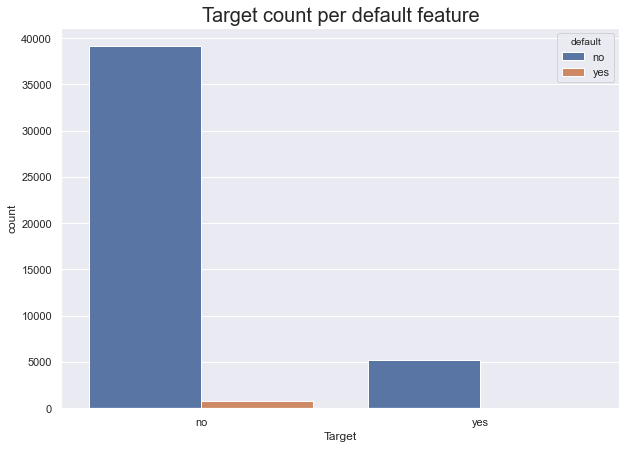

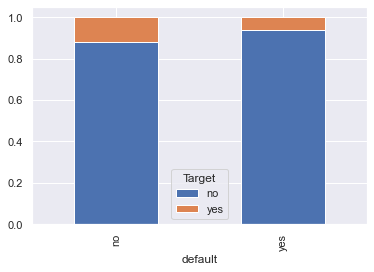

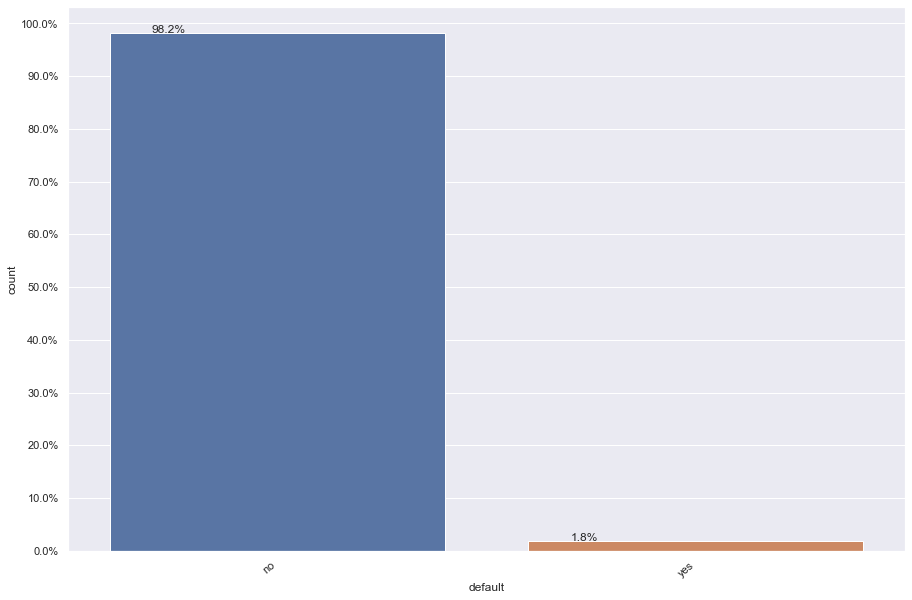

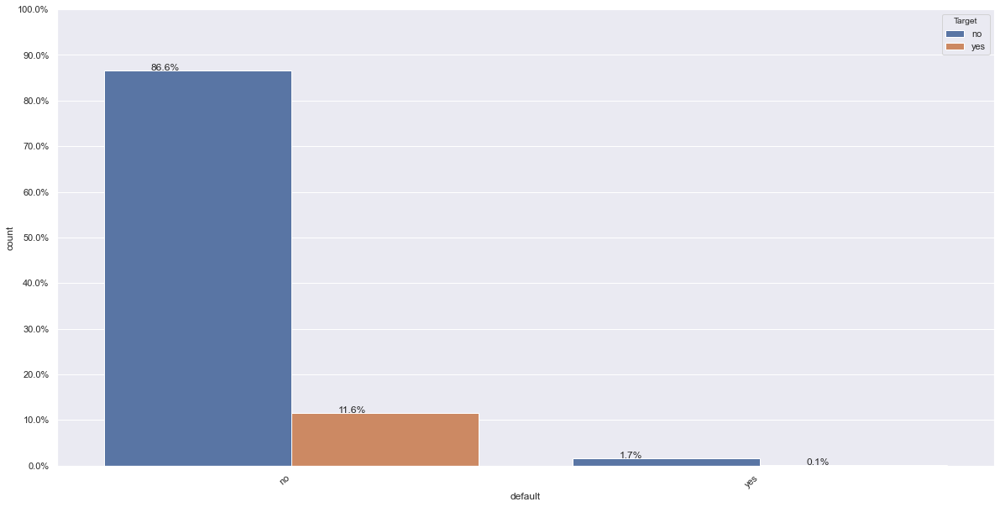

Count:
Target      no   yes
housing             
no       16727  3354
yes      23195  1935

Percent:
Target          no        yes
housing                      
no       83.297645  16.702355
yes      92.300040   7.699960



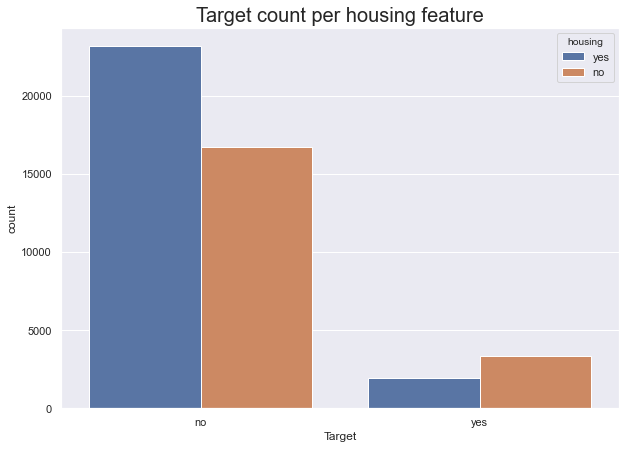

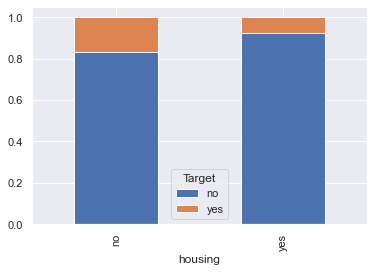

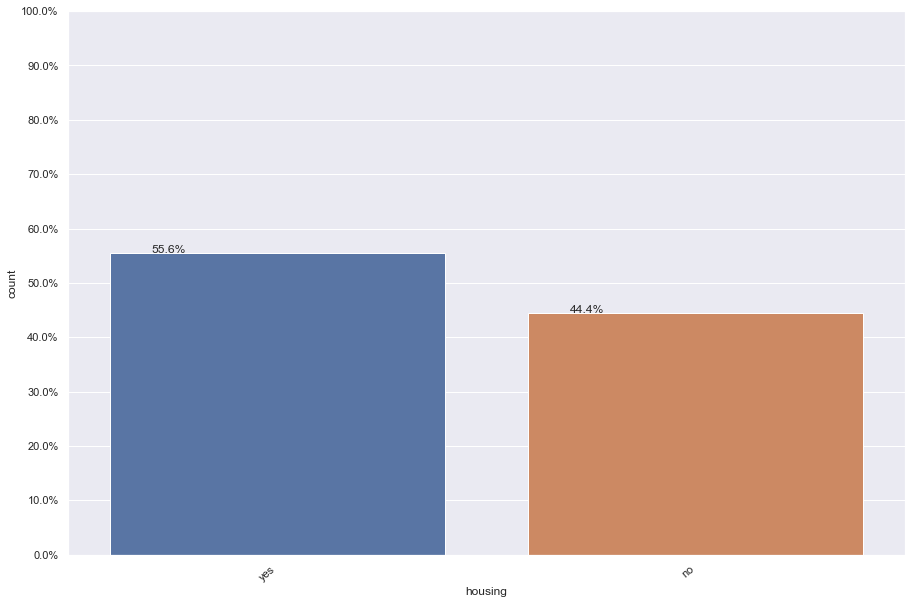

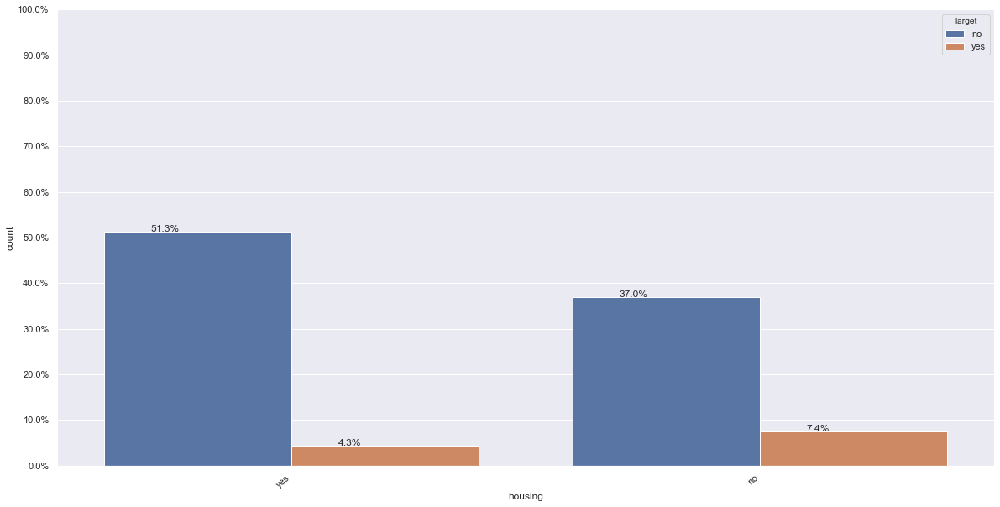

Count:
Target     no   yes
loan               
no      33162  4805
yes      6760   484

Percent:
Target         no        yes
loan                        
no      87.344273  12.655727
yes     93.318609   6.681391



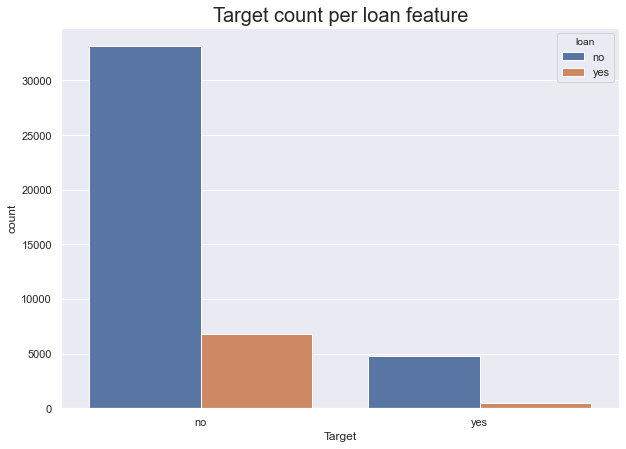

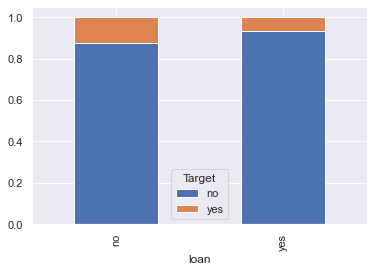

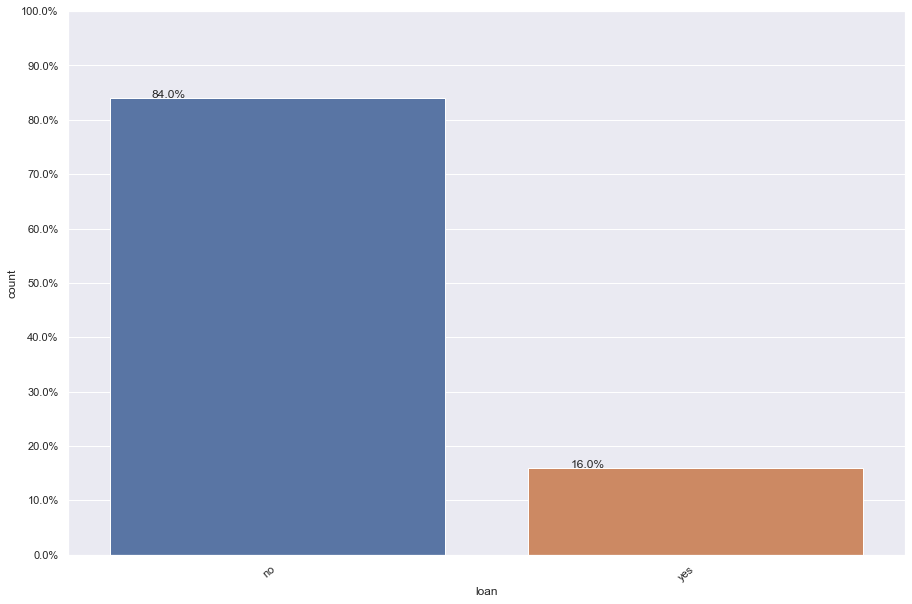

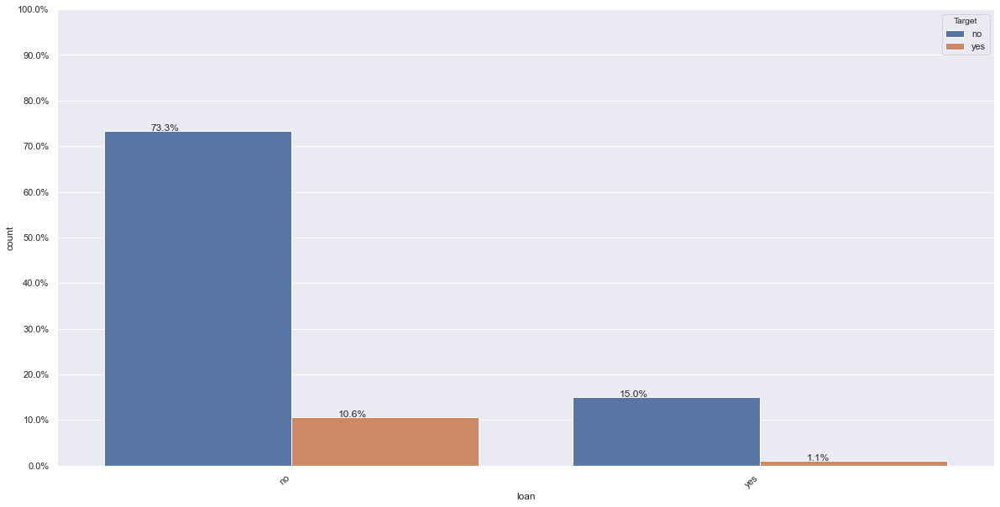

Count:
Target           no   yes
job                      
admin.         4540   631
blue-collar    9024   708
entrepreneur   1364   123
housemaid      1131   109
management     8157  1301
retired        1748   516
self-employed  1392   187
services       3785   369
student         669   269
technician     6757   840
unemployed     1101   202
unknown         254    34

Percent:
Target                no        yes
job                                
admin.         87.797331  12.202669
blue-collar    92.725031   7.274969
entrepreneur   91.728312   8.271688
housemaid      91.209677   8.790323
management     86.244449  13.755551
retired        77.208481  22.791519
self-employed  88.157061  11.842939
services       91.116996   8.883004
student        71.321962  28.678038
technician     88.943004  11.056996
unemployed     84.497314  15.502686
unknown        88.194444  11.805556



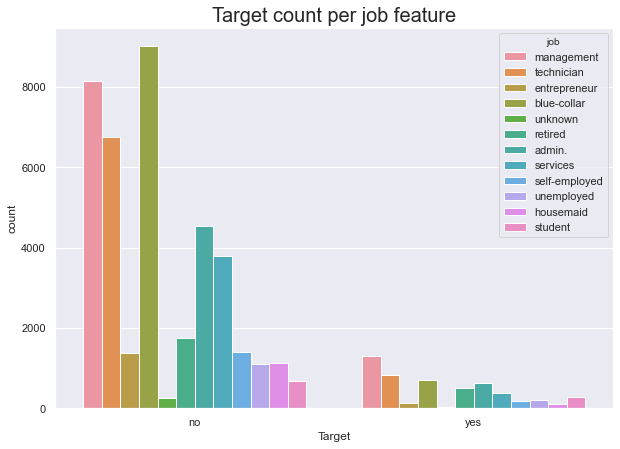

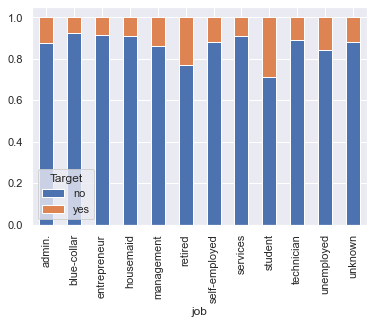

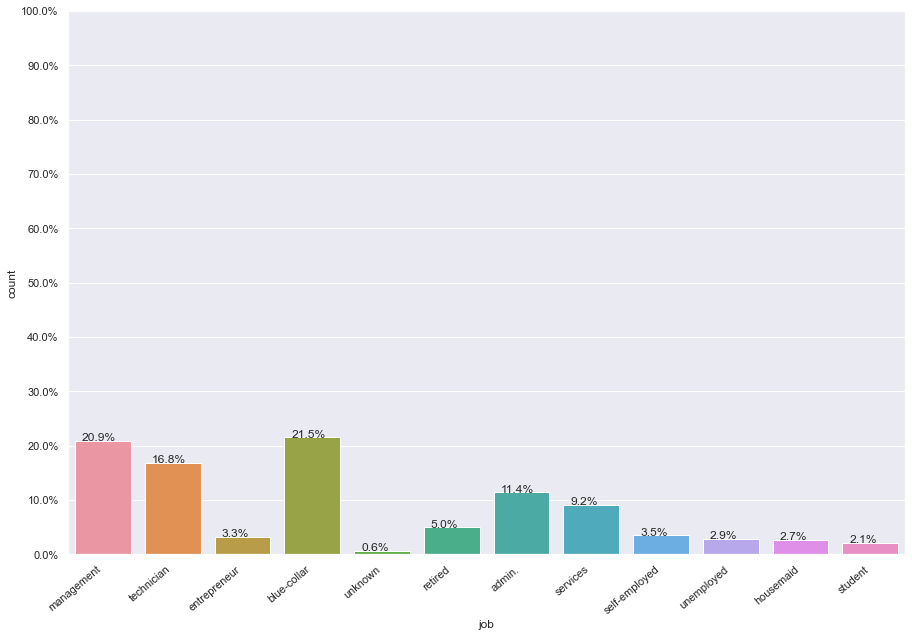

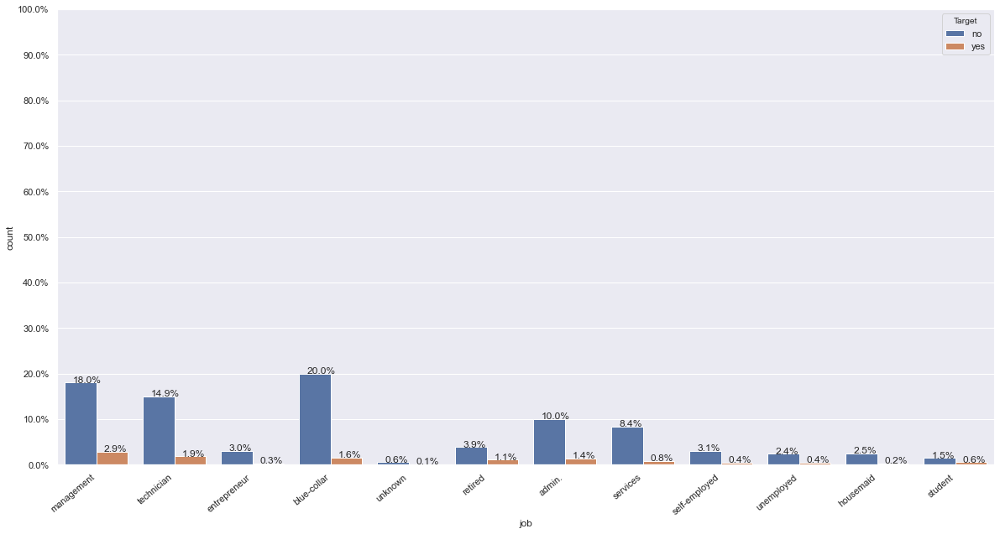

Count:
Target       no   yes
marital              
divorced   4585   622
married   24459  2755
single    10878  1912

Percent:
Target           no        yes
marital                       
divorced  88.054542  11.945458
married   89.876534  10.123466
single    85.050821  14.949179



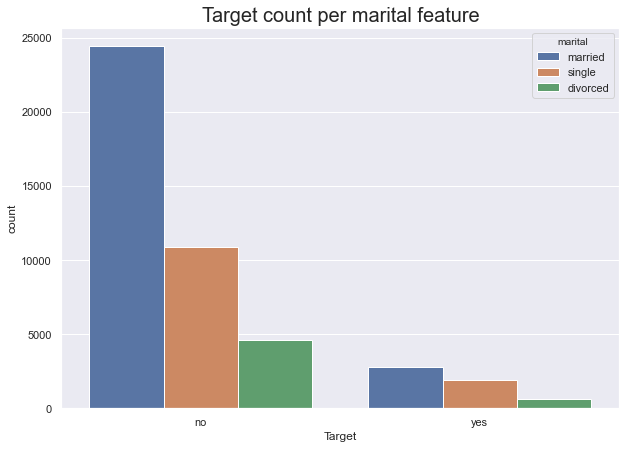

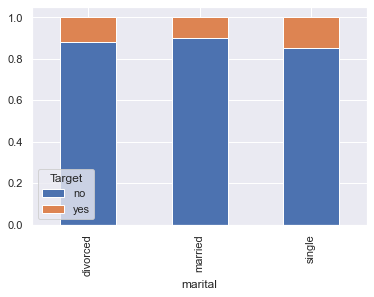

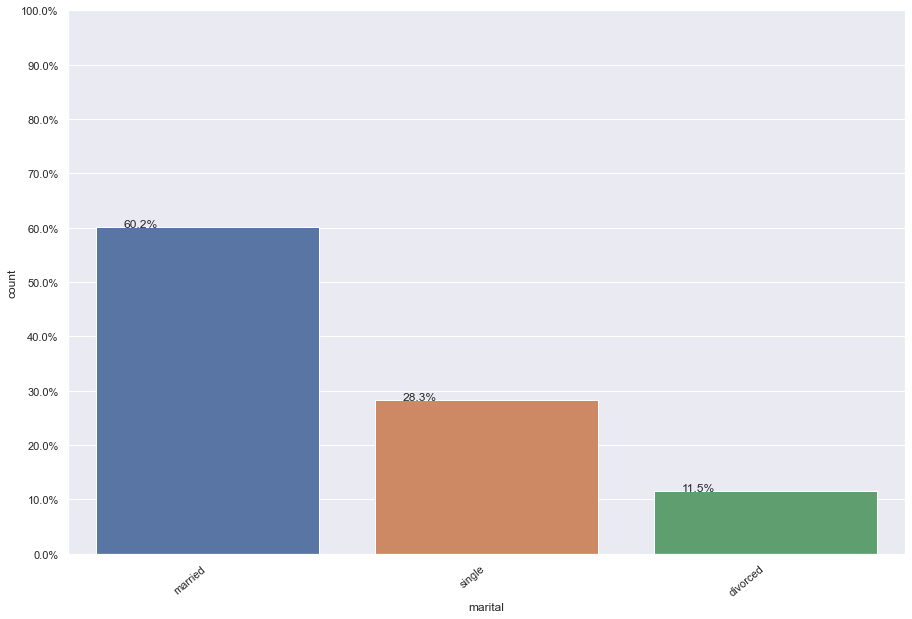

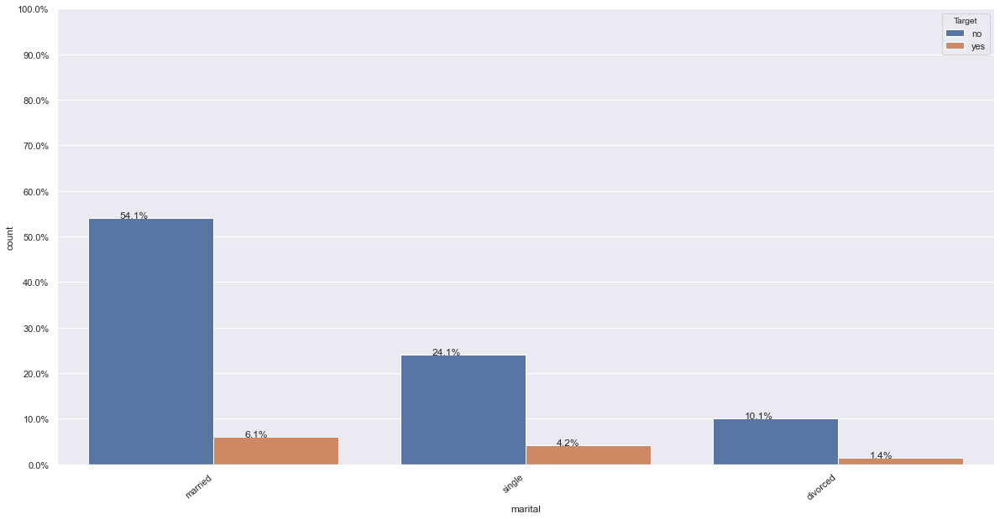

Count:
Target        no   yes
education             
primary     6260   591
secondary  20752  2450
tertiary   11305  1996
unknown     1605   252

Percent:
Target            no        yes
education                      
primary    91.373522   8.626478
secondary  89.440565  10.559435
tertiary   84.993610  15.006390
unknown    86.429725  13.570275



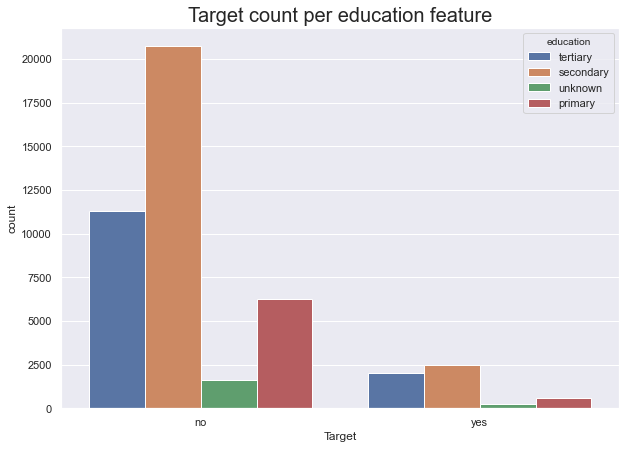

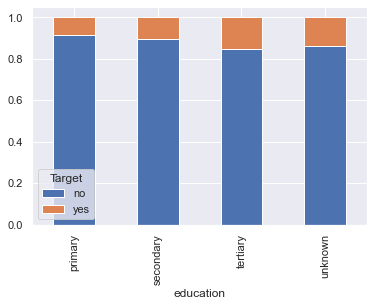

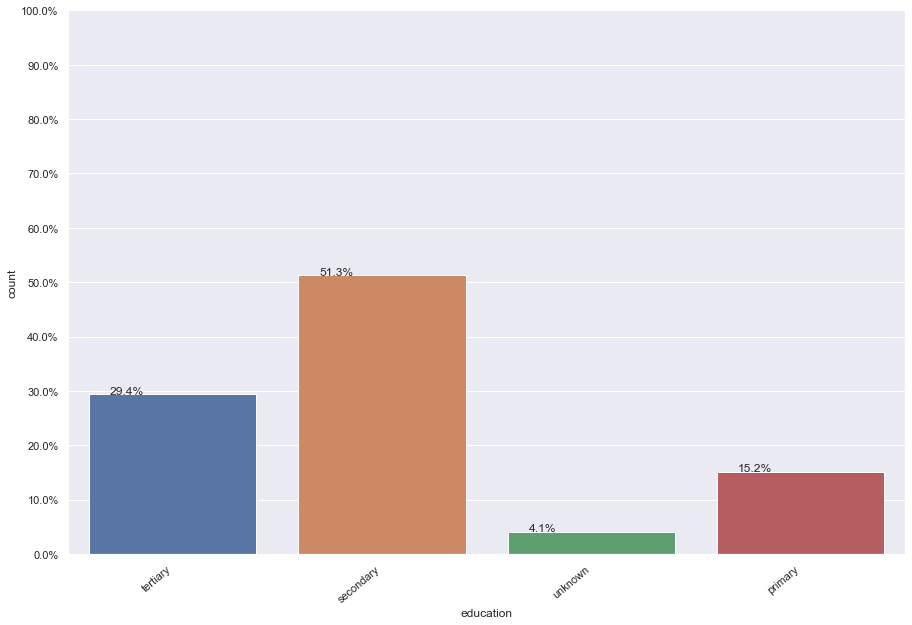

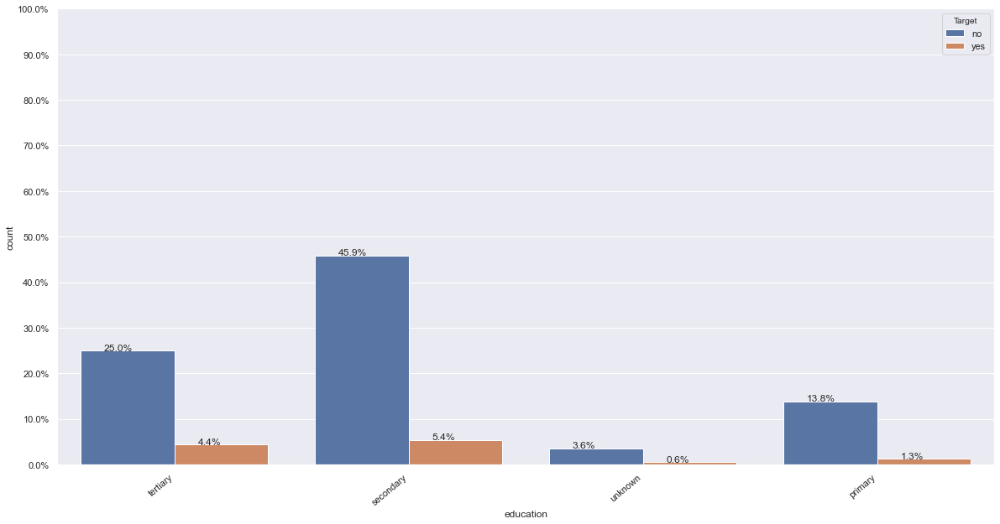

Count:
Target        no   yes
contact               
cellular   24916  4369
telephone   2516   390
unknown    12490   530

Percent:
Target            no        yes
contact                        
cellular   85.081100  14.918900
telephone  86.579491  13.420509
unknown    95.929339   4.070661



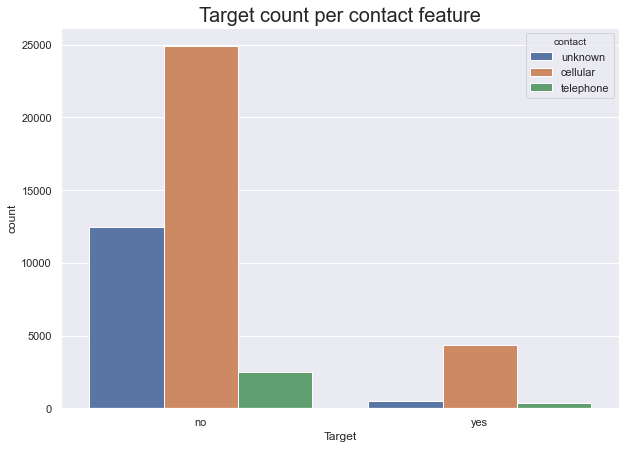

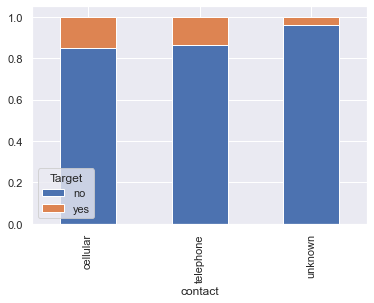

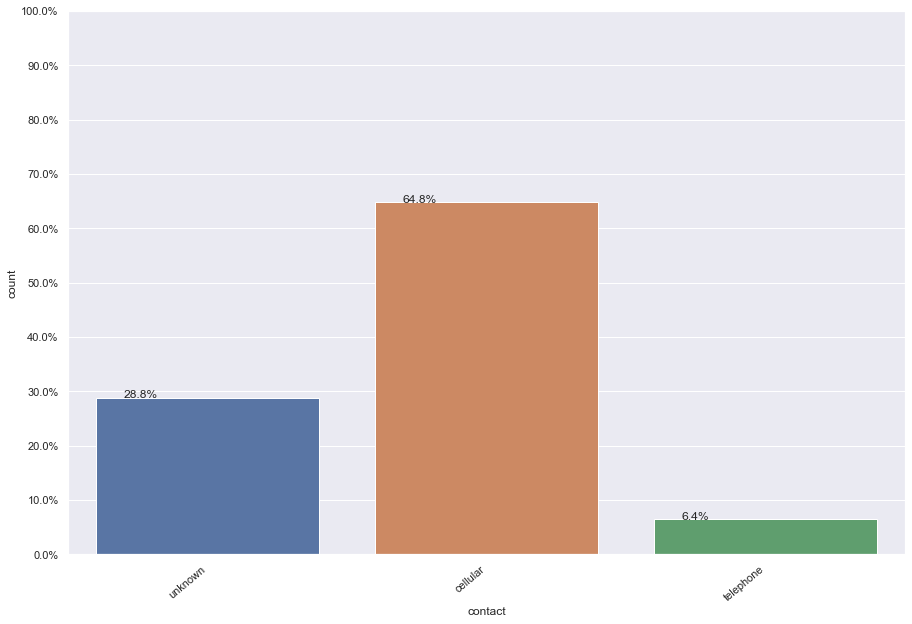

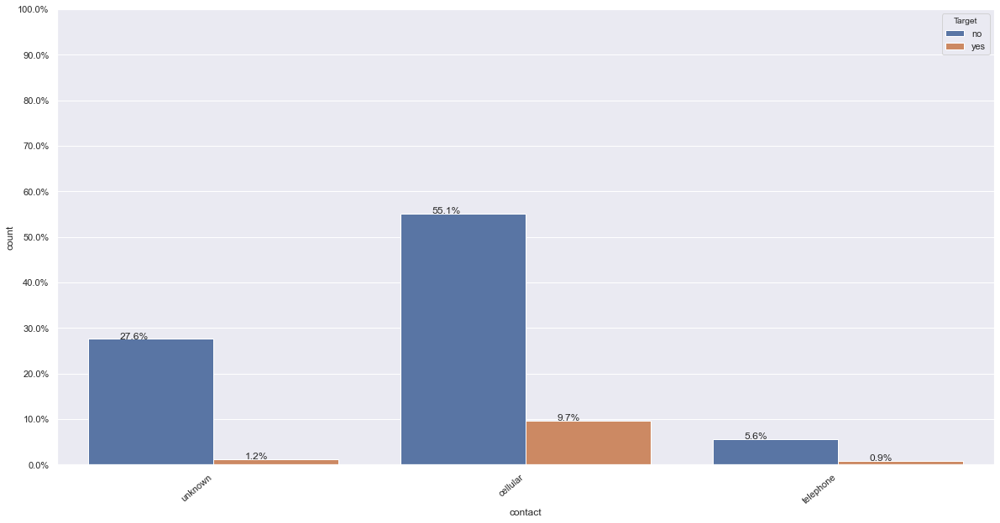

Count:
Target    no  yes
day              
1        232   90
2       1111  182
3        901  178
4       1215  230
5       1695  215
6       1751  181
7       1660  157
8       1641  201
9       1382  179
10       403  121
11      1298  181
12      1359  244
13      1344  241
14      1638  210
15      1465  238
16      1223  192
17      1763  176
18      2080  228
19      1635  122
20      2560  192
21      1825  201
22       751  154
23       813  126
24       385   62
25       707  133
26       919  116
27       971  150
28      1687  143
29      1616  129
30      1295  271
31       597   46

Percent:
Target         no        yes
day                         
1       72.049689  27.950311
2       85.924207  14.075793
3       83.503244  16.496756
4       84.083045  15.916955
5       88.743455  11.256545
6       90.631470   9.368530
7       91.359384   8.640616
8       89.087948  10.912052
9       88.532992  11.467008
10      76.908397  23.091603
11      87.762001  12.237999
12      84.7

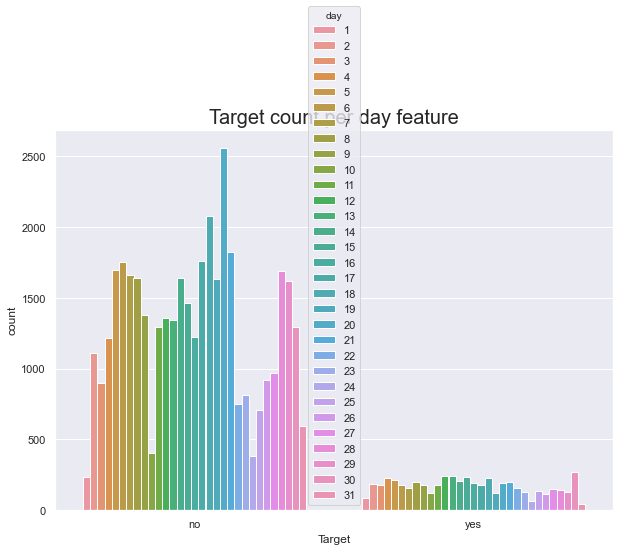

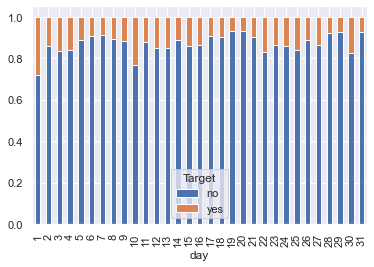

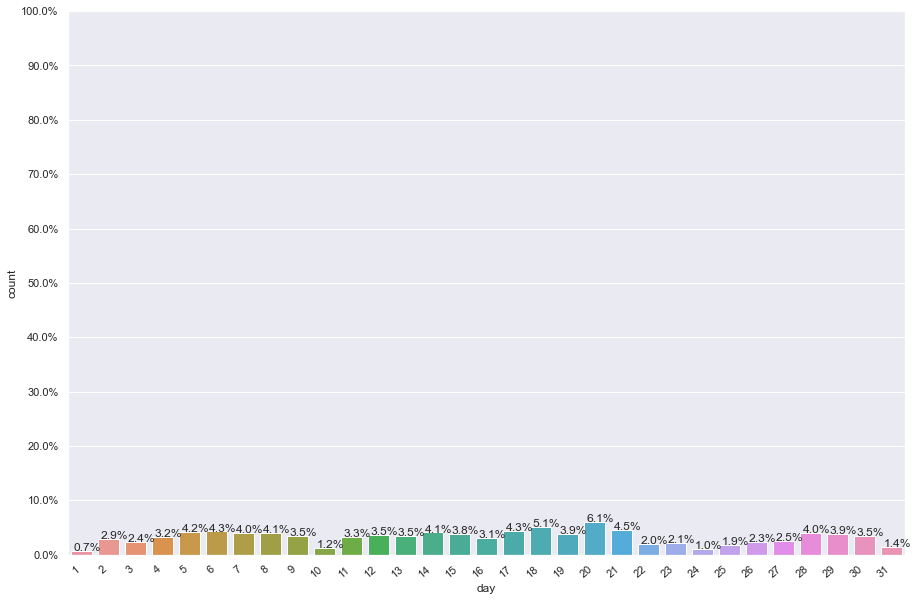

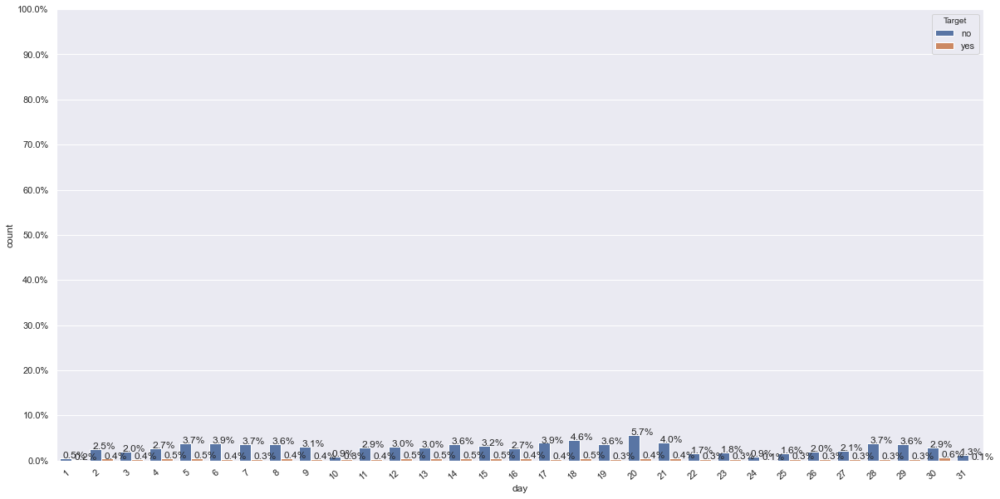

Count:
Target     no  yes
month             
apr      2355  577
aug      5559  688
dec       114  100
feb      2208  441
jan      1261  142
jul      6268  627
jun      4795  546
mar       229  248
may     12841  925
nov      3567  403
oct       415  323
sep       310  269

Percent:
Target         no        yes
month                       
apr     80.320600  19.679400
aug     88.986714  11.013286
dec     53.271028  46.728972
feb     83.352208  16.647792
jan     89.878831  10.121169
jul     90.906454   9.093546
jun     89.777195  10.222805
mar     48.008386  51.991614
may     93.280546   6.719454
nov     89.848866  10.151134
oct     56.233062  43.766938
sep     53.540587  46.459413



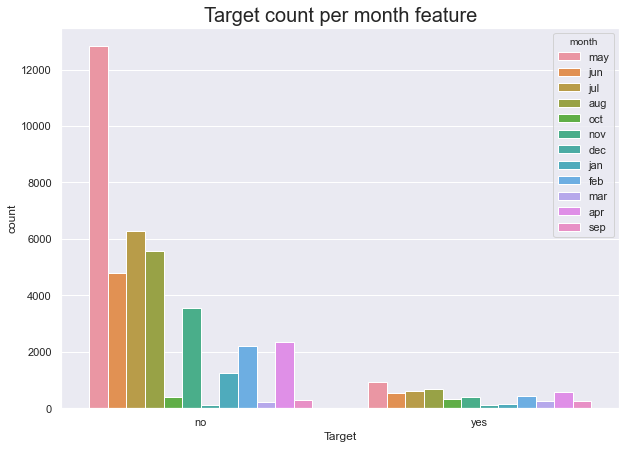

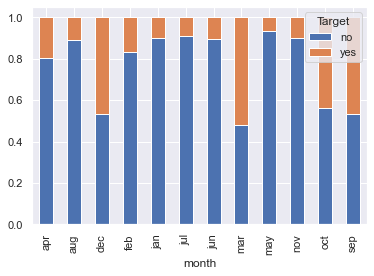

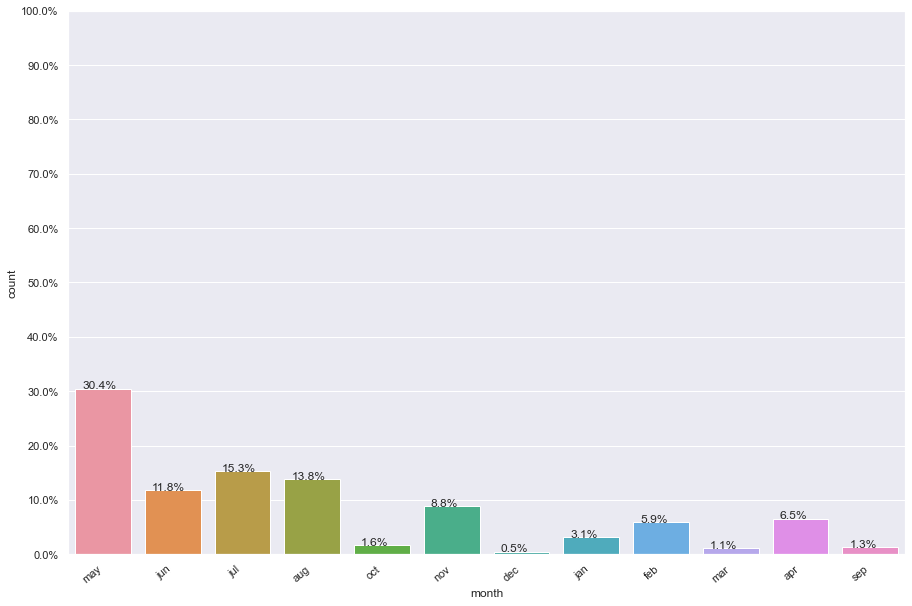

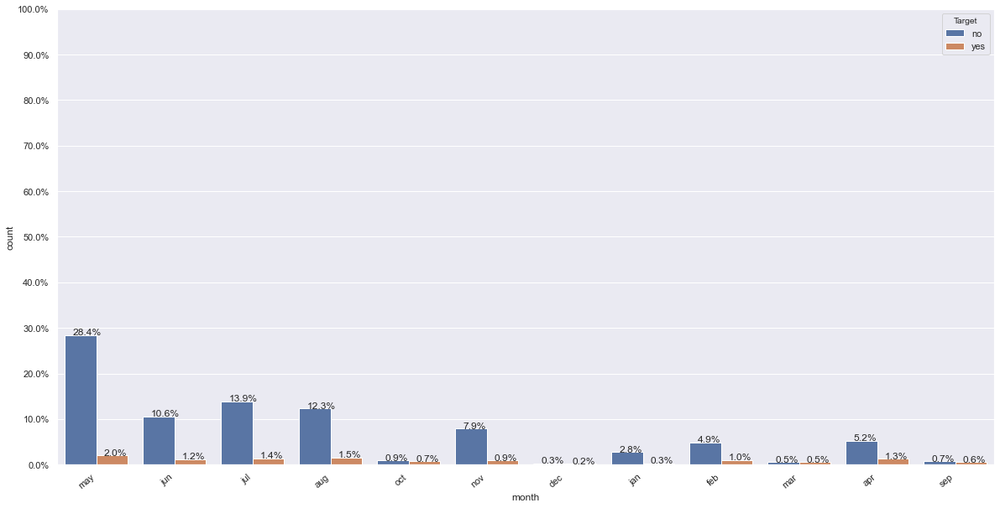

Count:
Target       no   yes
poutcome             
failure    4283   618
other      1533   307
success     533   978
unknown   33573  3386

Percent:
Target           no        yes
poutcome                      
failure   87.390329  12.609671
other     83.315217  16.684783
success   35.274653  64.725347
unknown   90.838497   9.161503



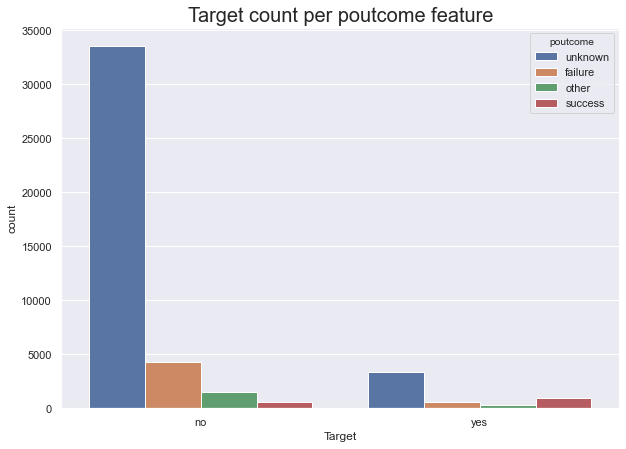

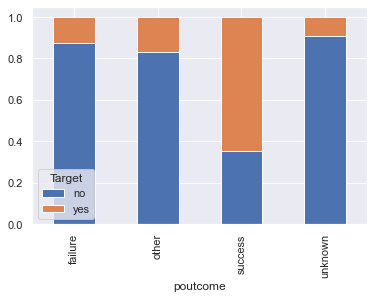

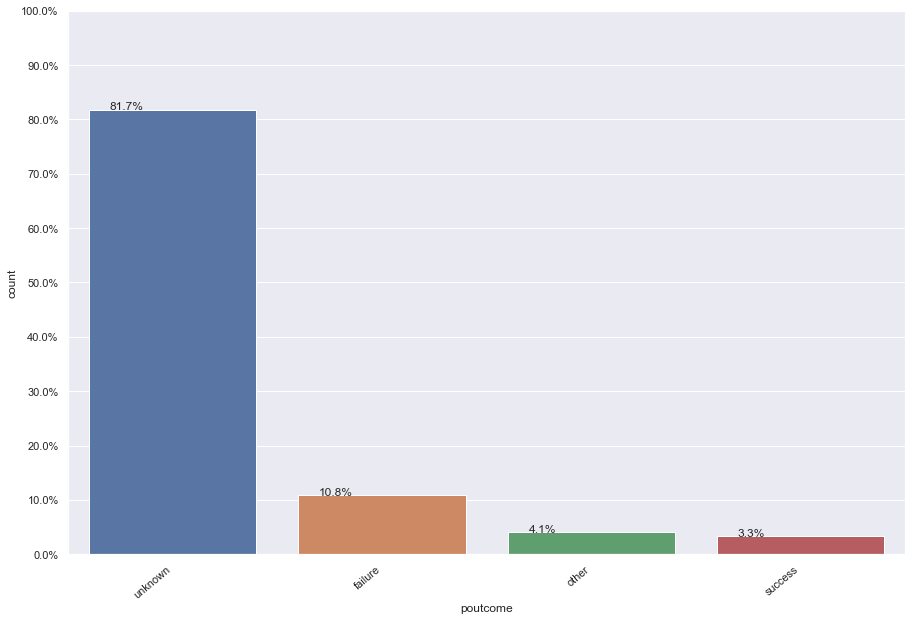

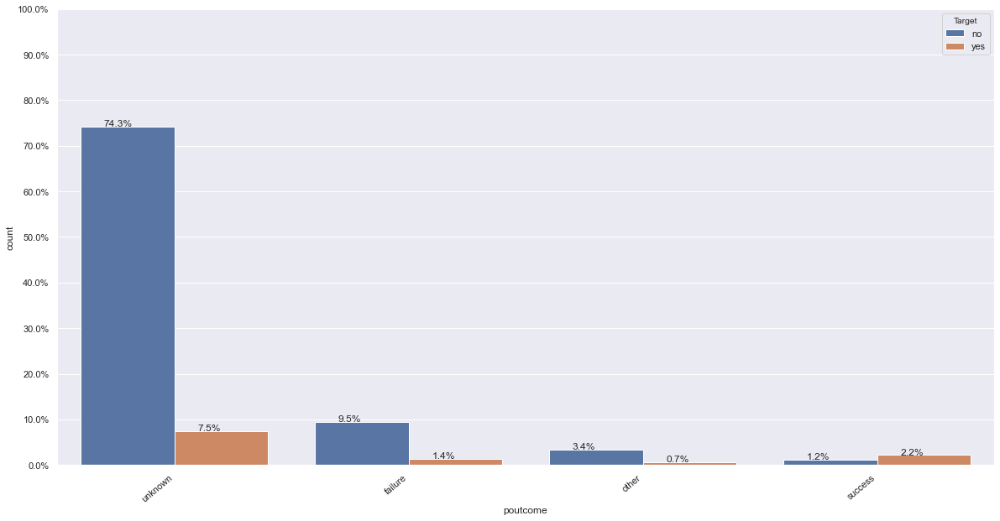

In [19]:
 for col in categorical_cols:
     univariant_categorical(col, 'Target')

In [20]:
def box_independent_hue(independent):
    plt.figure(figsize=(10,7))
    sns.boxplot(data=df, x = 'Target', y = independent);
    plt.show()

def box_independent(independent):
    plt.figure(figsize=(10,7))
    sns.boxplot(data=df, x = independent);
    plt.show()
    
def dist_plot(independent, skip_dist_plot=False):
    if skip_dist_plot:
        return
    plt.figure(figsize=(10,7))
    sns.distplot(df[independent]);

def dist_plot_hue(independent):
    plt.figure(figsize=(10,7))
    # sns.countplot(x=independent, hue='Target', data=df);
    plt.hist(df[independent], density=True)
    
def density_plot(independent, dependent):
    sns.distplot(df[df[dependent]=='no'][independent],color='r',label=0)
    sns.distplot(df[df[dependent]=='yes'][independent],color='g',label=1)
    plt.legend()
    plt.show()
    
def univariant_contineous(independent, dependent, skip_dist_plot=False):
    # density_plot(independent, dependent)
    box_independent(independent)
    # box_independent_hue(independent)
    dist_plot_hue(independent)
    dist_plot(independent, skip_dist_plot)

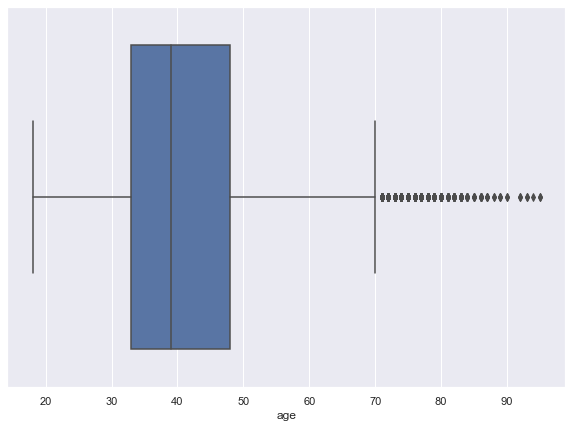

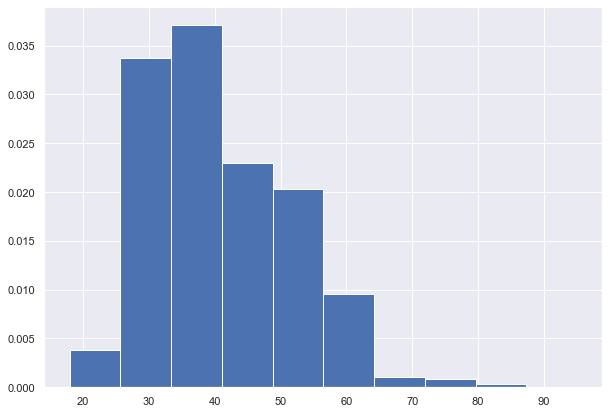

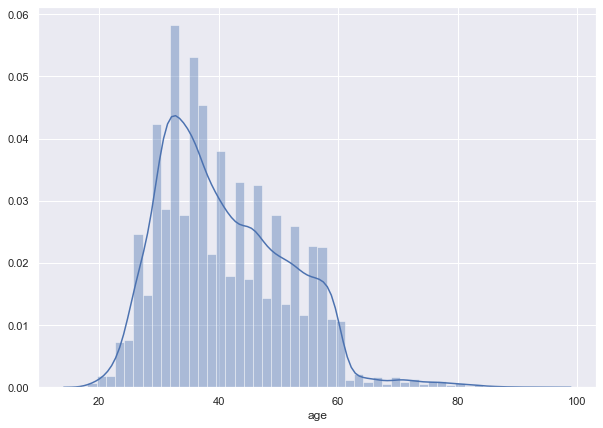

In [21]:
univariant_contineous('age', 'Target')

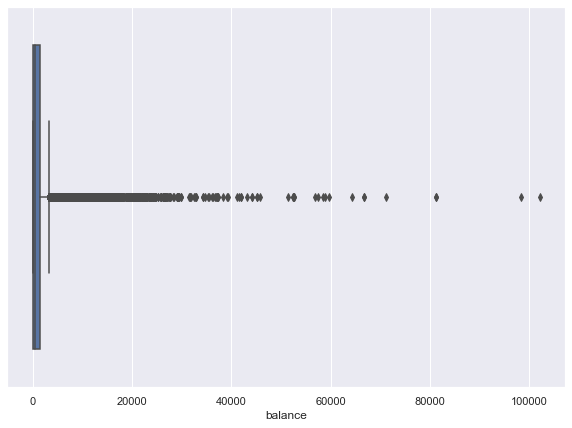

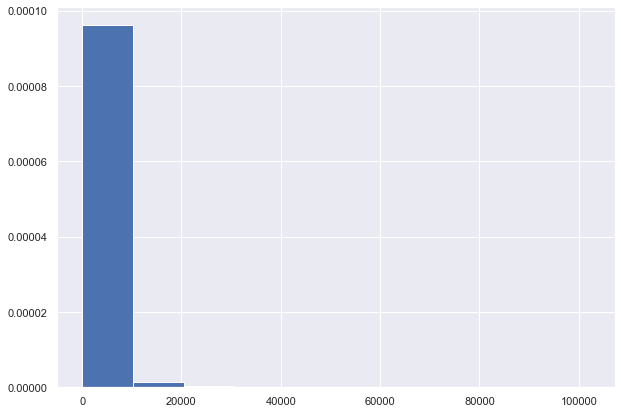

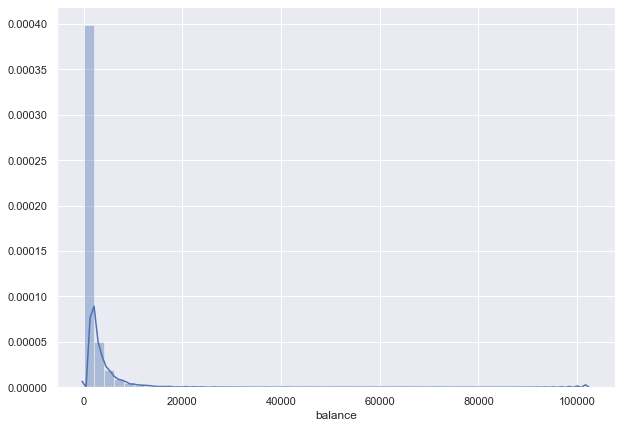

In [22]:
univariant_contineous('balance', 'Target')

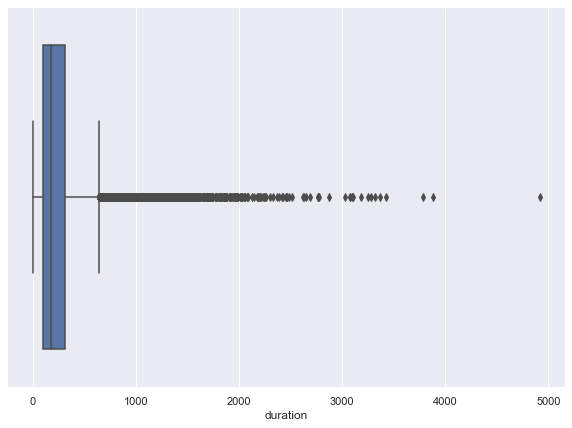

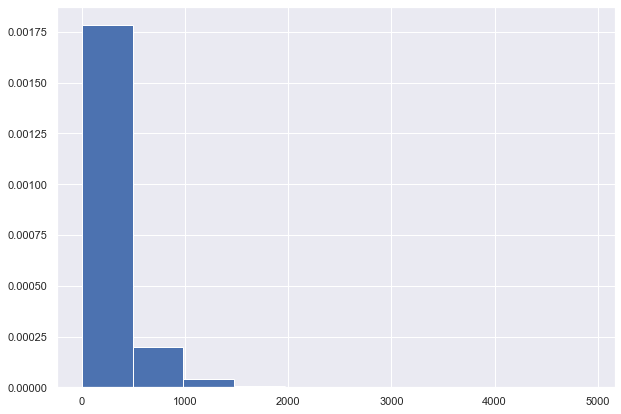

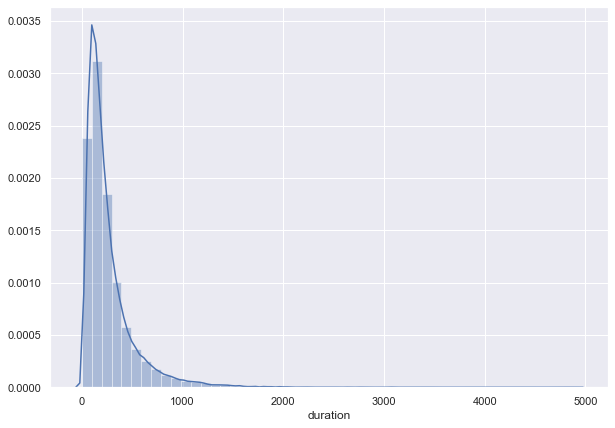

In [23]:
univariant_contineous('duration', 'Target')

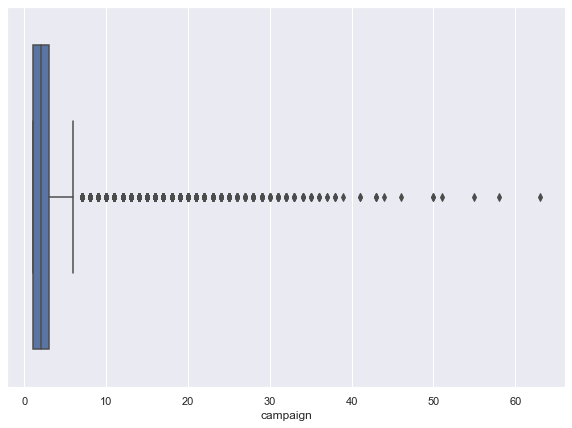

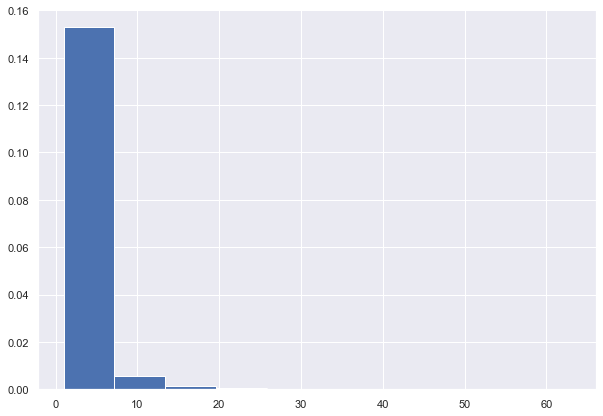

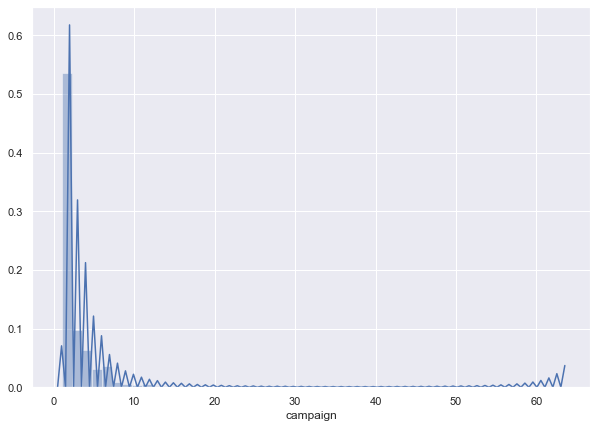

In [24]:
univariant_contineous('campaign', 'Target')

In [25]:
df["previous"].unique()

array([  0,   3,   1,   4,   2,  11,  16,   6,   5,  10,  12,   7,  18,
         9,  21,   8,  14,  15,  26,  37,  13,  25,  20,  27,  17,  23,
        38,  29,  24,  51, 275,  22,  19,  30,  58,  28,  32,  40,  55,
        35,  41])

In [26]:
df["previous"].value_counts()

0      36954
1       2772
2       2106
3       1142
4        714
5        459
6        277
7        205
8        129
9         92
10        67
11        65
12        44
13        38
15        20
14        19
17        15
16        13
19        11
23         8
20         8
22         6
18         6
24         5
27         5
29         4
25         4
21         4
30         3
28         2
26         2
37         2
38         2
55         1
40         1
35         1
58         1
51         1
41         1
32         1
275        1
Name: previous, dtype: int64

In [27]:
df[df["Target"]=="yes"]["previous"].value_counts()

0     3384
1      583
2      456
3      294
4      171
5      121
6       83
7       54
8       39
10      26
9       24
11      15
12      10
13       9
14       5
17       3
19       2
20       1
15       1
58       1
30       1
21       1
29       1
23       1
22       1
26       1
55       1
Name: previous, dtype: int64

In [28]:
df[df["Target"]=="no"]["previous"].value_counts()

0      33570
1       2189
2       1650
3        848
4        543
5        338
6        194
7        151
8         90
9         68
11        50
10        41
12        34
13        29
15        19
14        14
16        13
17        12
19         9
23         7
20         7
18         6
27         5
24         5
22         5
25         4
21         3
29         3
38         2
37         2
28         2
30         2
40         1
41         1
275        1
51         1
35         1
26         1
32         1
Name: previous, dtype: int64

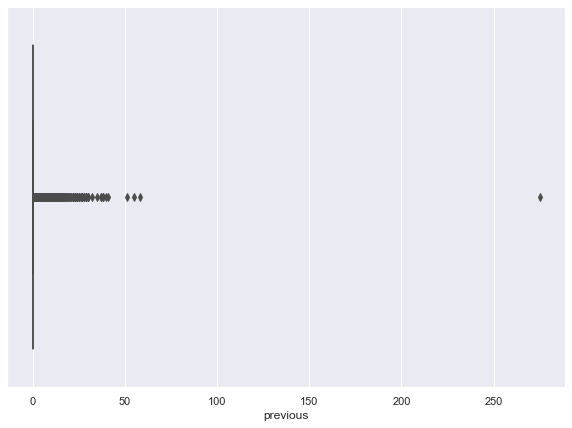

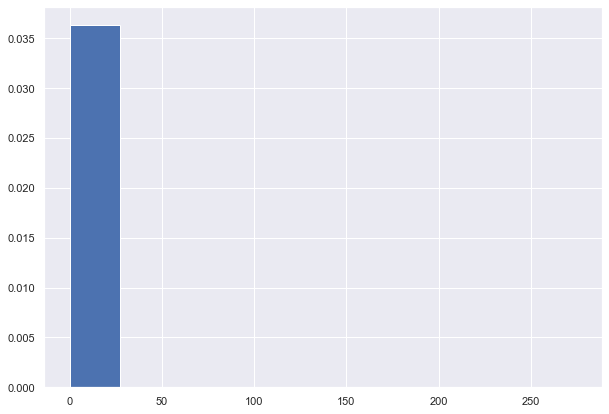

In [29]:
univariant_contineous('previous', 'Target', skip_dist_plot=True)
# box_independent('previous')
    # box_independent_hue(independent)
#     dist_plot_hue(independent)
#     dist_plot(independent)

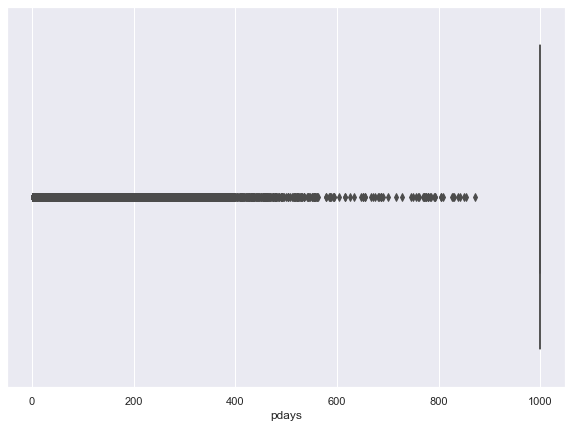

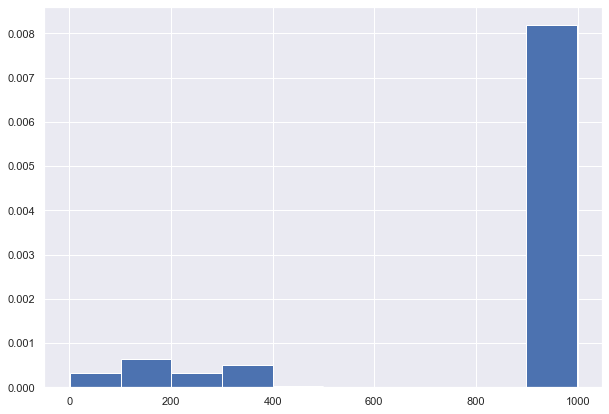

In [30]:
univariant_contineous('pdays', 'Target', skip_dist_plot=True)

### Observation

#### Customer defaulted or not does not impact a lot to the term deposit account. As can be seen, 11% customers not defaulted have term deposit, whereas 6% of customers that are defaulted have term desposit account
#### 16% of customer with no housing loan have term deposits, whereas 7% with housing loans have term deposit
#### 12% of customer with no personal loan have term deposits, whereas 6% with personal loans have term deposit
#### 28% of students, 22% of retired customers have term deposits, others job categories are fiarly distributed
#### From the above distribution we can see that most of the customers have jobs as "admin", "blue-collar" or "technician". One interesting thing to find out would be to see the distribution for each classes as well. For example, how many people who work as an admin have subscribed a term deposit.
#### From the above plot, we can see that the customers who have a job of admin have the highest rate of subscribing a term deposit, but they are also the highest when it comes to not subscribing. This is simply because we have more customers working as admin than any other profession. We can find out the odds or ratio of subscribing and not subscribing based on the profession, to find out which profession has the highest odds of subscribing given the data. At this point we are not sure if there is any correlation between job and target variable. Idea: If we find that odds of one profession subscribing is greater than other job, we can use the odds or log(odds) as a feature by replacing jobs field with the odds, instead of doing one hot encoding.
#### From the above plot, we can see that the customers who have a job of admin have the highest rate of subscribing a term deposit, but they are also the highest when it comes to not subscribing. This is simply because we have more customers working as admin than any other profession. We can find out the odds or ratio of subscribing and not subscribing based on the profession, to find out which profession has the highest odds of subscribing given the data. At this point we are not sure if there is any correlation between job and target variable. Idea: If we find that odds of one profession subscribing is greater than other job, we can use the odds or log(odds) as a feature by replacing jobs field with the odds, instead of doing one hot encoding.
#### Majority of the customers have a housing loan.
#### The day of the week seems to be irrelevent as we have the same amount of data for all the days of the week, and no:yes ratio is also almost same.

### Multivariate Analysis <a class="anchor" id='1.2'></a>


In [32]:
def multivariant_contineous(independent, dependent):
    density_plot(independent, dependent)
    box_independent_hue(independent)
    dist_plot_hue(independent)    

In [33]:
df[df['pdays'] < 0]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


In [34]:
# Treat the -1 value in pdays, to get a predictable distribution and inform 
# that the customers were really not been contacted for long, replace all -1 with 999

df.pdays[df.pdays == -1] = 999 

In [35]:
df[df['pdays'] < 0].pdays

Series([], Name: pdays, dtype: int64)

#### Replace unknowns from 'contact' with 'cellular' and 'telephone' proportionately.

In [36]:
# Replace unknown values of 'contact' variable proportionately with cellular and telephone
contact_count = df.contact.value_counts()
cell_per =  contact_count['cellular'] / (contact_count['cellular'] + contact_count['telephone'])
cell_cnt = int(round(contact_count['unknown'] * cell_per))

contact_ranges = df.contact.values.tolist()
for i in range(len(contact_ranges)):
    if contact_ranges[i] == 'unknown':
        if cell_cnt > 0:
            contact_ranges[i] = 'cellular'
            cell_cnt -= 1
        else:
            contact_ranges[i] = 'telephone'
df['contact'] = contact_ranges

print("unknown contact count: ", df[df.contact == 'unknown'].shape[0])

unknown contact count:  0


#### Treat unknown jobs

In [37]:
# Let's look at cross tabulation between job and education
pd.crosstab(df['education'], df['job'])

job,admin.,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
education,,,,,,,,,,,,
primary,209,3758,183,627,294,795,130,345,44,158,257,51
secondary,4219,5371,542,395,1121,984,577,3457,508,5229,728,71
tertiary,572,149,686,173,7801,366,833,202,223,1968,289,39
unknown,171,454,76,45,242,119,39,150,163,242,29,127


In [38]:
# Customers with primary and secondary education have more blue-collar jobs; while customers with
# secondary education have more management jobs
df.loc[(df.job == 'unknown') & 
           ((df.education =='primary') | (df.education =='secondary')), 'job'] = 'blue-collar'

df.loc[(df.job == 'unknown') & (df.education == 'tertiary'), 'job'] = 'management'
print("Number of customers left with unknown jobs: ", df[df.job == 'unknown'].shape[0])

Number of customers left with unknown jobs:  127


In [39]:
# Let's look at the ages for different job categories.
ja_df = df.groupby('job').age.min().to_frame().T
ja_df = ja_df.append(df.groupby('job').age.mean().to_frame().T, ignore_index=True)
ja_df = ja_df.append(df.groupby('job').age.max().to_frame().T, ignore_index=True)
ja_df.index = ['min. age', 'avg. age', 'max. age']
ja_df

job,admin.,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
min. age,20.000000,20.000000,21.000000,22.000000,21.000000,24.000000,22.000000,20.00000,18.000000,21.000000,21.000000,25.000000
avg. age,39.289886,40.111731,42.190989,46.415323,40.476782,61.626767,40.484484,38.74025,26.542644,39.314598,40.961627,49.755906
max. age,75.000000,75.000000,84.000000,83.000000,81.000000,95.000000,76.000000,69.00000,48.000000,71.000000,66.000000,82.000000


In [40]:
# For customers who have unknown education and job values, we can try infering their job based on their ages

# Let's mark all customers above 60 as retired
df.loc[(df.job == 'unknown') & (df.age > 60), 'job'] = 'retired'

# Let's mark all customers between age 15 and 25 as students
df.loc[(df.job == 'unknown') & ((df.age > 15) & (df.age <= 25)), 'job'] = 'student'

# Based on distribution of age alone it's difficult to further infer job values.
# Let's mark the remaining customers (about 115) as unemployed for simplicity.
df.loc[df.job == 'unknown', 'job'] = 'unemployed'

print("unknown jobs count: ", df[df.job == 'unknown'].shape[0])

unknown jobs count:  0


#### Treat unknown education

In [41]:
ea_df = df.groupby('education').age.min().to_frame().T
ea_df = ea_df.append(df.groupby('education').age.mean().to_frame().T, ignore_index=True)
ea_df = ea_df.append(df.groupby('education').age.max().to_frame().T, ignore_index=True)
ea_df.index = ['min. age', 'avg. age', 'max. age']
ea_df

education,primary,secondary,tertiary,unknown
min. age,18.000000,18.00000,20.00000,18.000000
avg. age,45.865567,39.96427,39.59364,44.510501
max. age,95.000000,95.00000,89.00000,93.000000


In [42]:
# Get popular education levels per job category
edu_per_job = df.groupby('job').apply(lambda x: x['education'].value_counts().index[0])
edu_job_dict = {x:y for (x,y) in zip(edu_per_job.index, edu_per_job.values)}

# Replace unknowns from education with corresponding popular education level for that job
df['education'] = df.apply(lambda x : edu_job_dict[x['job']] if x['education'] == 'unknown' 
                                     else x['education'], axis=1)
print("unknown education levels: ", df[df.education == 'unknown'].shape[0])

unknown education levels:  0


#### poutcome have a relation with pdays but not strong enough to build an imputation against it

In [43]:
cont_cols = ['age', 'balance', 'duration', 'campaign', 'previous', 'pdays']


for col in cont_cols:
    print()
    print (col, ':', df[col].value_counts())


age : 32    2085
31    1996
33    1972
34    1930
35    1894
      ... 
90       2
92       2
93       2
95       2
94       1
Name: age, Length: 77, dtype: int64

balance : 0        3514
1         245
2         181
3         156
4         154
         ... 
64343       1
7864        1
5567        1
6955        1
2709        1
Name: balance, Length: 6258, dtype: int64

duration : 124     188
90      184
89      177
122     175
104     175
       ... 
2150      1
1970      1
1906      1
1842      1
2015      1
Name: duration, Length: 1573, dtype: int64

campaign : 1     17544
2     12505
3      5521
4      3522
5      1764
6      1291
7       735
8       540
9       327
10      266
11      201
12      155
13      133
14       93
15       84
16       79
17       69
18       51
19       44
20       43
21       35
22       23
23       22
25       22
24       20
28       16
29       16
26       13
31       12
27       10
32        9
30        8
33        6
34        5
36        4
35        

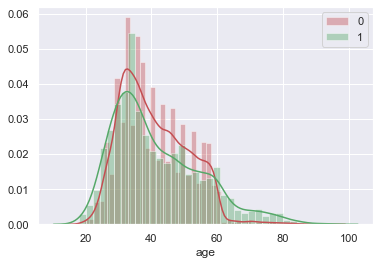

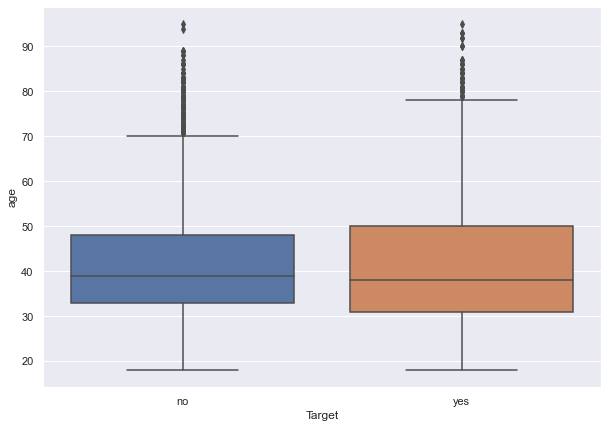

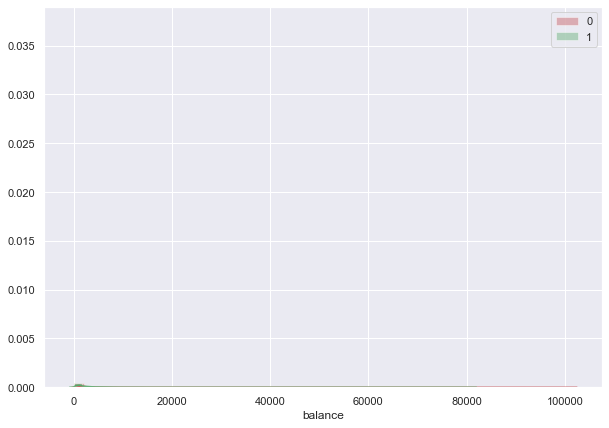

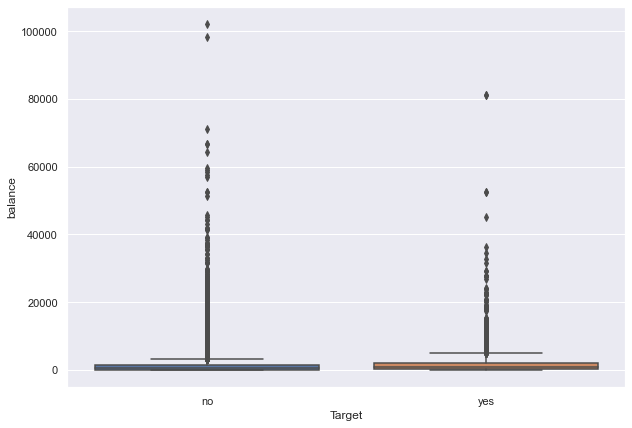

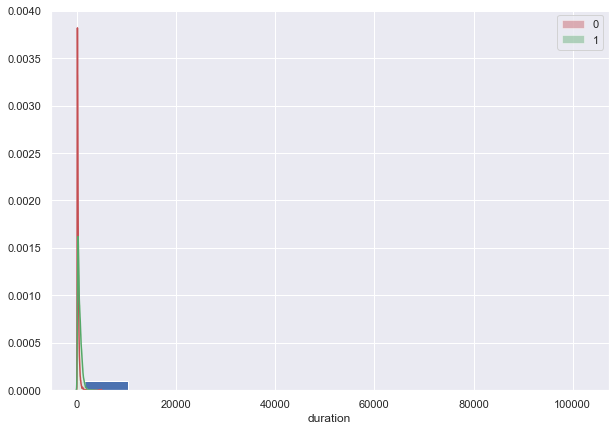

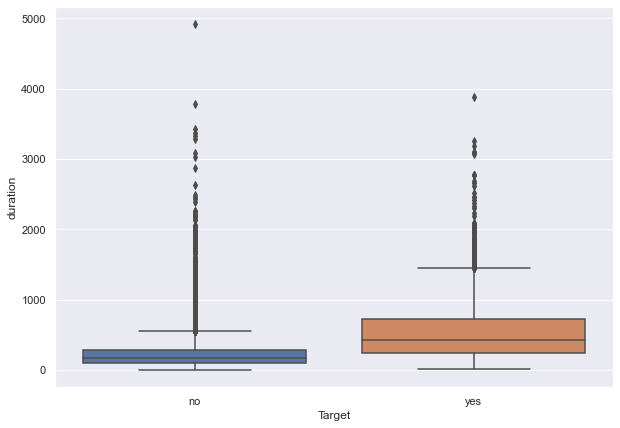

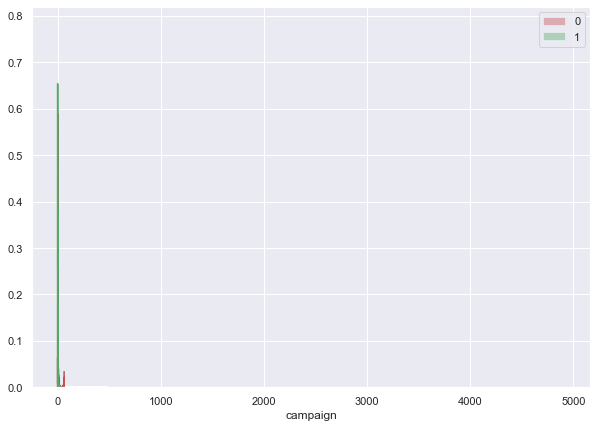

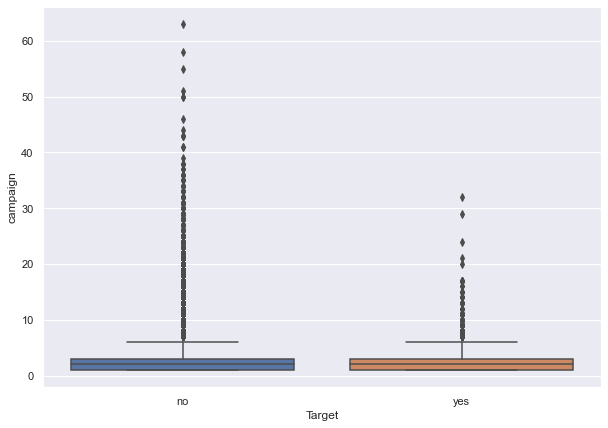

Cannot plot for  previous
Cannot plot for  pdays


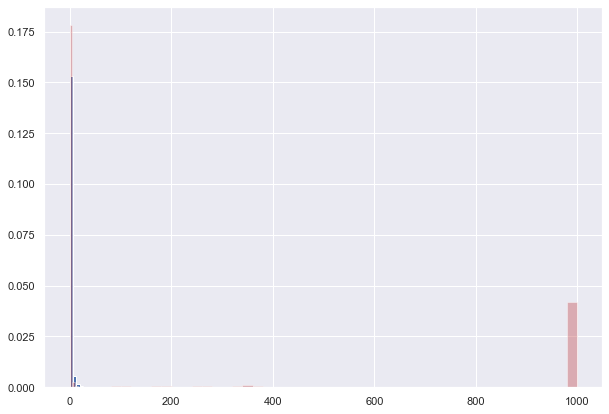

In [44]:
cont_cols = ['age', 'balance', 'duration', 'campaign', 'previous', 'pdays']


for col in cont_cols:
    try:
        multivariant_contineous(col, 'Target')
    except:
        print('Cannot plot for ', col)

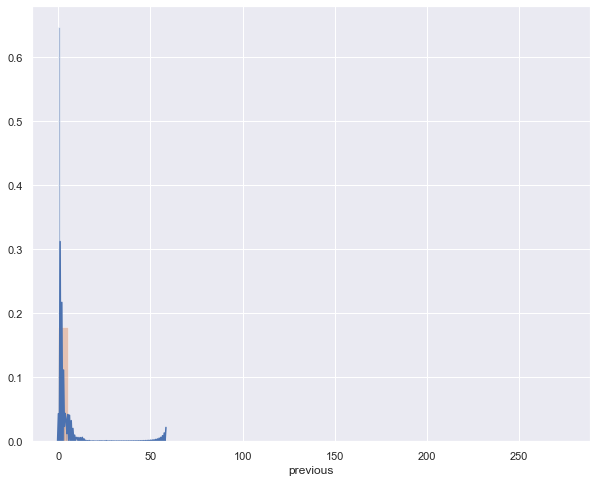

In [45]:
plt.figure(figsize=(10,8))
try:
    sns.distplot(df[df["Target"]=="yes"]["previous"])
    sns.distplot(df[df["Target"]=="no"]["previous"])
except:
    print()
plt.show()

### Obervation on the above chart
#### From the above boxplot we know that for both the customers that subscibed or didn't subscribe a term deposit, has a median age of around 38-40. And the boxplot for both the classes overlap quite a lot, which means that age isn't necessarily a good indicator for which customer will subscribe and which customer will not.
#### As we can see in the above distribution also, that most of the customers are in the age range of 30-40.
#### the duration (last contact duration) of a customer can be useful for predicting the target variable. It is expected because it is already mentioned in the data overview that this field highely affects the target variable and should only be used for benchmark purposes. This seems like a powerlaw distribution where most the values are very low and very few have high values.
#### Most of the 'pdays' values are 999, which means that the most of the customers have never been contacted before.
#### Quite a number of outliers in all contineous features, we will treat them using Robust Scaler 


In [46]:
df = df.replace({'Target': {'yes': 1, 'no': 0}})

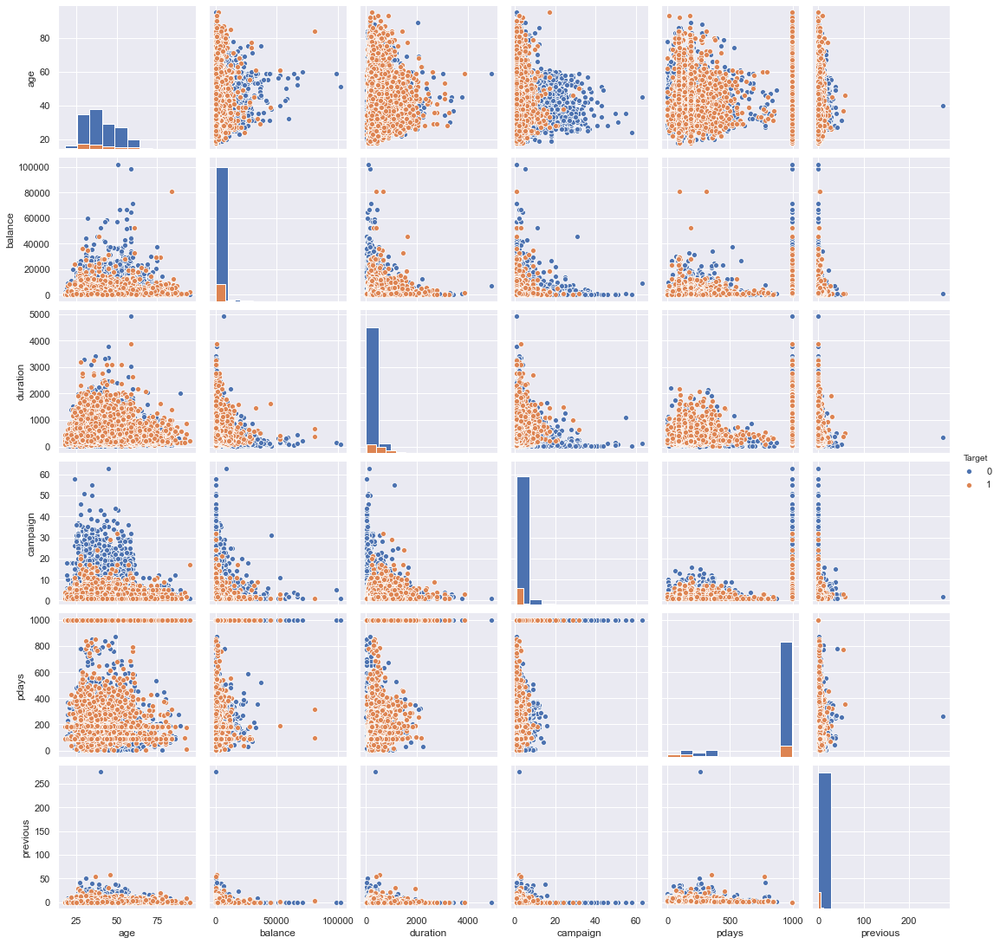

In [47]:
pair_cols = contineous_cols + ['Target']

sns.pairplot(df[pair_cols], hue='Target', diag_kind='hist');

### Observation of the pair plot

#### we see relation between balance, duration and campaign but not strong enough to drop it during model building
#### balance, duration, pdays and previous are strongly skewed

In [48]:
df.corr()

,age,balance,day,duration,campaign,pdays,previous,Target
age,1.000000,0.097475,-0.009120,-0.004648,0.004760,-0.008804,0.001288,0.025155
balance,0.097475,1.000000,0.007073,0.021043,-0.013718,-0.034436,0.015324,0.049783
day,-0.009120,0.007073,1.000000,-0.030206,0.162490,0.079074,-0.051710,-0.028348
duration,-0.004648,0.021043,-0.030206,1.000000,-0.084570,-0.005090,0.001203,0.394521
campaign,0.004760,-0.013718,0.162490,-0.084570,1.000000,0.108306,-0.032855,-0.073172
pdays,-0.008804,-0.034436,0.079074,-0.005090,0.108306,1.000000,-0.528910,-0.178898
previous,0.001288,0.015324,-0.051710,0.001203,-0.032855,-0.528910,1.000000,0.093236
Target,0.025155,0.049783,-0.028348,0.394521,-0.073172,-0.178898,0.093236,1.000000


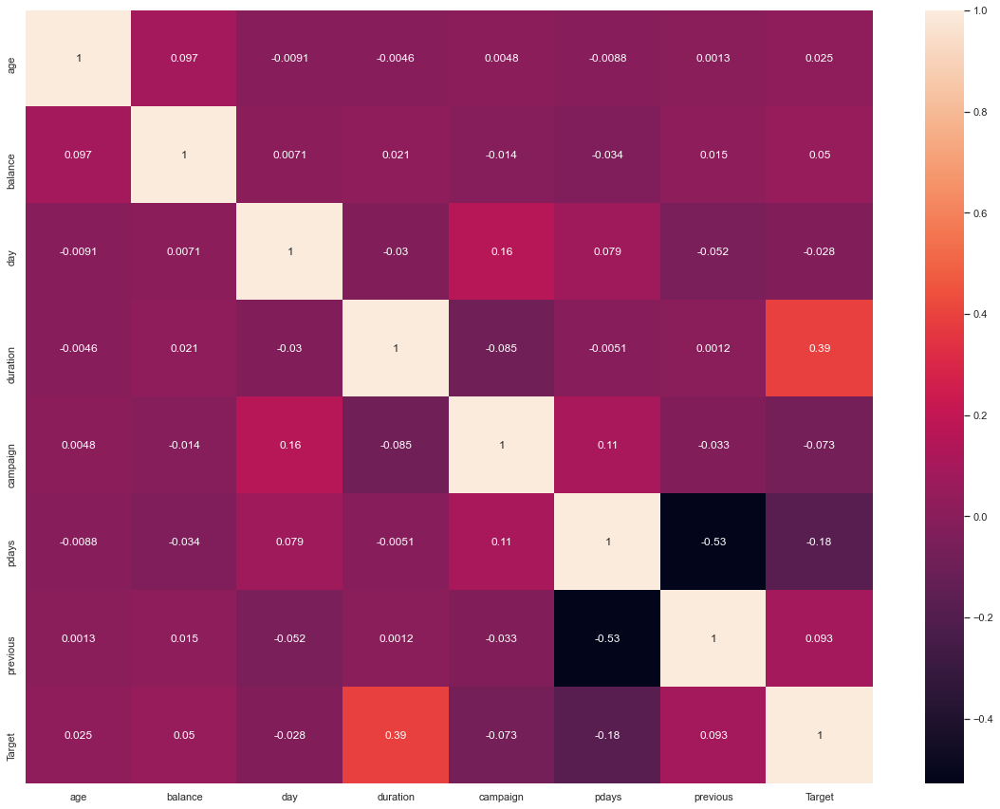

In [49]:
plt.figure(figsize=(20,15))

sns.heatmap(df.corr(), annot=True);

#### A fair correlation between pdays and previous, campaign and pdays and day

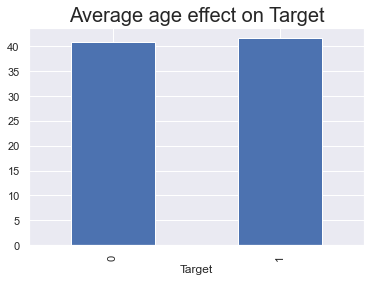

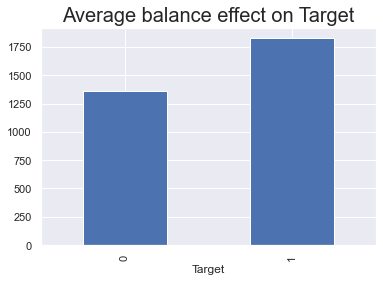

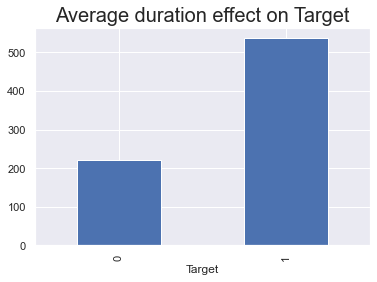

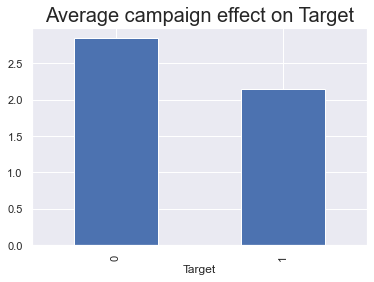

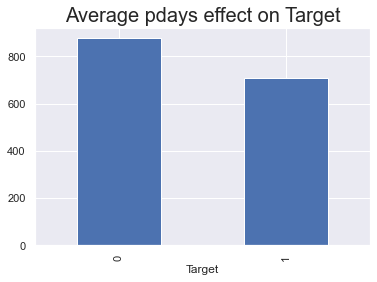

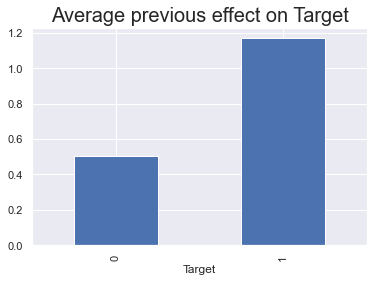

In [50]:
def average_contineous_plot(independent, dependent):
    df.groupby(dependent)[independent].mean().plot(kind='bar')
    plt.title('Average ' + independent + ' effect on ' + dependent, fontsize=20)
    plt.show()
    print()

for col in contineous_cols:
    average_contineous_plot(col, 'Target')

### Observation of the Average against Target above

#### Average age do not matter much against the term deposit
#### High average of balance, duration, campaign, pdays have effect on having a term deposit
#### more contacts performed causes more customers to have Term Deposit

In [51]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'Target'],
      dtype='object')

In [52]:
contineous_cols

['age', 'balance', 'duration', 'campaign', 'pdays', 'previous']

In [53]:
# Let's look at the skewness of data
skew_df = pd.DataFrame({'Skewness' : [stats.skew(df.age),
                                      stats.skew(df.balance),
                                      stats.skew(df.duration),
                                      stats.skew(df.campaign),
                                      stats.skew(df.pdays),
                                      stats.skew(df.previous)]},
                       index=['Age','balance','duration','campaign','pdays', 'previous'])
skew_df

,Skewness
Age,0.684795
balance,8.523783
duration,3.144214
campaign,4.898488
pdays,-1.736648
previous,41.845066


## Prepare the data for analytics <a class="anchor" id='2'></a>

### Ensure the attribute types are correct <a class="anchor" id='2.1'></a>

In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  int64 
dtypes: int64(8), object(9)
memory usage: 5.9+ MB


### Transform the data i.e. scale / normalize if required. <a class="anchor" id='2.2'></a>

#### Data Treatment

#### Treat outliers using Robust Scalar
#### Treat the categorical independent features using one-hot encoding
#### Treat missing data
#### Treat duplicate data
#### Treat incorrect value: -ve balance

### Dealing with incorrect values

#### We have already treated -ve balance and pdays during EDA

In [55]:
df['balance'] = df['balance'].abs()

In [56]:
df[df.balance < 0]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


#### Obervation: no -ve balance

### Dealing with missing values

#### From the above basic info of each feature, we know that there are no missing values in this dataset.

### Dealing with duplicate observations

In [57]:
data_dup = df[df.duplicated(keep="last")]
data_dup

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


#### No duplicates

### Treat the outliers using Robust scalar

In [58]:
data_processed = df.copy()

In [59]:
# treat the outliers using RobustScalar
from sklearn import preprocessing

scaler = preprocessing.RobustScaler()

# Get list of independent variables to scale
variables_to_scale = ['age', 'balance', 'duration', 'campaign', 'previous', 'pdays']

data_processed[variables_to_scale] = scaler.fit_transform(data_processed[variables_to_scale])

data_processed

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,1.266667,management,married,tertiary,no,1.276366,yes,no,cellular,5,may,0.375000,-0.5,0.0,0.0,unknown,0
1,0.333333,technician,single,secondary,no,-0.351039,yes,no,cellular,5,may,-0.134259,-0.5,0.0,0.0,unknown,0
2,-0.400000,entrepreneur,married,secondary,no,-0.371824,yes,yes,cellular,5,may,-0.481481,-0.5,0.0,0.0,unknown,0
3,0.533333,blue-collar,married,secondary,no,0.785989,yes,no,cellular,5,may,-0.407407,-0.5,0.0,0.0,unknown,0
4,-0.400000,unemployed,single,secondary,no,-0.372594,no,no,cellular,5,may,0.083333,-0.5,0.0,0.0,unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.800000,technician,married,tertiary,no,0.261740,no,no,cellular,17,nov,3.689815,0.5,0.0,0.0,unknown,1
45207,2.133333,retired,divorced,primary,no,0.957660,no,no,cellular,17,nov,1.277778,0.0,0.0,0.0,unknown,1
45208,2.200000,retired,married,secondary,no,4.026174,no,no,cellular,17,nov,4.384259,1.5,-815.0,3.0,success,1
45209,1.200000,blue-collar,married,secondary,no,0.140878,no,no,telephone,17,nov,1.518519,1.0,0.0,0.0,unknown,0


### One-hot encoding the categorical indpendent feature

In [60]:
categorical_feature_mask = df.dtypes==object

# filter categorical columns using mask and turn it into a list
categorical_cols = df.columns[categorical_feature_mask].tolist()

In [61]:
categorical_cols

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome']

In [62]:
categorical_cols.append('day')

In [63]:
categorical_cols

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome',
 'day']

In [64]:
for col in categorical_cols:
    data_processed[col] = data_processed[col].astype('category')

In [65]:
data_processed.dtypes

age           float64
job          category
marital      category
education    category
default      category
balance       float64
housing      category
loan         category
contact      category
day          category
month        category
duration      float64
campaign      float64
pdays         float64
previous      float64
poutcome     category
Target          int64
dtype: object

In [66]:
data_processed = pd.get_dummies(data_processed, drop_first=True)

# data_processed.rename(columns={'Target_yes': 'Target'}, inplace=True)

### Create training set and test set in ratio of 70:30 <a class="anchor" id='2.3'></a>

In [67]:
from sklearn.model_selection import train_test_split

pdata = data_processed.copy() 

pdata

X = pdata.drop('Target',axis=1)     # Predictor feature columns
y = pdata['Target']   # Predicted class (1=True, 0=False) (1 X m)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.head()

,age,balance,duration,campaign,pdays,previous,job_blue-collar,job_entrepreneur,job_housemaid,job_management,...,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success,poutcome_unknown
10747,-0.200000,-0.373364,-0.125000,1.0,0.0,0.0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
26054,1.133333,-0.222479,0.611111,0.5,0.0,0.0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,1
9125,0.466667,-0.373364,-0.449074,0.0,0.0,0.0,1,0,0,0,...,0,1,0,0,0,0,0,0,0,1
41659,0.133333,2.264049,0.564815,-0.5,-880.0,5.0,0,0,0,1,...,0,0,0,0,0,1,0,0,1,0
4443,-0.066667,-0.373364,-0.416667,-0.5,0.0,0.0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,1


In [68]:
X_train.columns

Index(['age', 'balance', 'duration', 'campaign', 'pdays', 'previous',
       'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'marital_married',
       'marital_single', 'education_secondary', 'education_tertiary',
       'default_yes', 'housing_yes', 'loan_yes', 'contact_telephone', 'day_2',
       'day_3', 'day_4', 'day_5', 'day_6', 'day_7', 'day_8', 'day_9', 'day_10',
       'day_11', 'day_12', 'day_13', 'day_14', 'day_15', 'day_16', 'day_17',
       'day_18', 'day_19', 'day_20', 'day_21', 'day_22', 'day_23', 'day_24',
       'day_25', 'day_26', 'day_27', 'day_28', 'day_29', 'day_30', 'day_31',
       'month_aug', 'month_dec', 'month_feb', 'month_jan', 'month_jul',
       'month_jun', 'month_mar', 'month_may', 'month_nov', 'month_oct',
       'month_sep', 'poutcome_other', 'poutcome_success', 'poutcome_unknown'],
      dtype='object')

# Run the data against different models

## Create Ensemble Model <a class="anchor" id='3'></a>

## Logistics Regression using statsmodel <a class="anchor" id='3.1'></a>

In [69]:
## Helping function to calculate the scores

def print_model_score(model, y_predict):
    print("Training accuracy",model.score(X_train,y_train))  
    print()
    print("Testing accuracy",model.score(X_test, y_test))
    print()
    print('Confusion Matrix')
    print(draw_cm(y_test,y_predict))
    print()
    print("Recall:",recall_score(y_test,y_predict))
    print()
    print("Precision:",precision_score(y_test,y_predict))
    print()
    print("F1 Score:",f1_score(y_test,y_predict))
    print()
    print("Roc Auc Score:",roc_auc_score(y_test,y_predict))

### Model building using Logistic Regression from Sklearn 

We will use the sklearn library to build the model and make predictions

In [70]:
#Build the logistic regression model
import statsmodels.api as sm

logit = sm.Logit(y_train, sm.add_constant(X_train))
lg = logit.fit()

Optimization terminated successfully.
         Current function value: 0.240805
         Iterations 8


In [71]:
#Summary of logistic regression
from scipy import stats
stats.chisqprob = lambda chisq, df: stats.chi2.sf(chisq, df)
print(lg.summary())

                           Logit Regression Results                           
Dep. Variable:                 Target   No. Observations:                31647
Model:                          Logit   Df Residuals:                    31578
Method:                           MLE   Df Model:                           68
Date:                Wed, 29 Jul 2020   Pseudo R-squ.:                  0.3314
Time:                        20:06:46   Log-Likelihood:                -7620.8
converged:                       True   LL-Null:                       -11398.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  -0.8859      0.357     -2.484      0.013      -1.585      -0.187
age                    -0.0061      0.039     -0.156      0.876      -0.083       0.070
balance         

#### Calculate the odds ratio from the coef using the formula odds ratio=exp(coef)

#### Calculate the probability from the odds ratio using the formula probability = odds / (1+odds)

In [72]:
#Calculate Odds Ratio, probability
##create a data frame to collate Odds ratio, probability and p-value of the coef
lgcoef = pd.DataFrame(lg.params, columns=['coef'])
lgcoef.loc[:, "Odds_ratio"] = np.exp(lgcoef.coef)
lgcoef['probability'] = lgcoef['Odds_ratio']/(1+lgcoef['Odds_ratio'])
lgcoef['pval']=lg.pvalues
pd.options.display.float_format = '{:.2f}'.format

In [73]:
# FIlter by significant p-value (pval <0.1) and sort descending by Odds ratio
lgcoef = lgcoef.sort_values(by="Odds_ratio", ascending=False)
pval_filter = lgcoef['pval']<=0.1
lgcoef[pval_filter]

,coef,Odds_ratio,probability,pval
poutcome_success,2.27,9.63,0.91,0.00
month_mar,1.21,3.37,0.77,0.00
duration,0.90,2.45,0.71,0.00
month_oct,0.61,1.84,0.65,0.00
month_sep,0.46,1.58,0.61,0.00
education_tertiary,0.45,1.57,0.61,0.00
job_student,0.31,1.37,0.58,0.02
education_secondary,0.23,1.26,0.56,0.00
job_retired,0.22,1.25,0.56,0.05
poutcome_other,0.22,1.25,0.56,0.04


#### Observation

- most of the independent features are contributing to the result

### Model building using Logistic Regression from Sklearn <a class="anchor" id='3.2'></a>

We will use the sklearn library to build the model and make predictions

In [74]:
# from sklearn import metrics

# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score,accuracy_score, classification_report

# # Fit the model on train
# lg_clf = LogisticRegression(random_state=42)
# lg_clf.fit(X_train, y_train)

In [75]:
col_types = [('classifier', str),
             ('train score', np.float128), 
             ('test score', np.float128), 
             ('recall score', np.float128), 
             ('precision score', (np.float128)), 
             ('F1 score', np.float128), 
             ('roc auc score', np.float128)]

df_compare_model = pd.DataFrame({k: pd.Series(dtype=t) for k, t in col_types})

df_compare_model.style.format({'train score': '{:.6f}', 'test score': '{:.6f}', 'recall score': '{:.6f}', 
                              'precision score': '{:.6f}', 'F1 score': '{:.6f}', 'roc auc score': '{:.6f}'})

,classifier,train score,test score,recall score,precision score,F1 score,roc auc score


In [76]:
## function to get confusion matrix in a proper format
def draw_cm( actual, predicted):
    cm = confusion_matrix( actual, predicted)
    print (cm)
    
    # print('The confusion matrix')

    print('')
    print ('True Positives (TP): we correctly predicted that they will take personal loans ', cm[1, 1])

    print('')
    print ('True Negatives (TN): we correctly predicted that they will not take personal loan ', cm[0, 0])

    print('')
    print ('False Positives (FP): we incorrectly predicted that they will take personal loan (a "Type I error") ', cm[0, 1], ' Falsely predict positive Type I error')

    print('')
    print ('False Negatives (FN): we incorrectly predicted that they will not take personal loans (a "Type II error")', cm[1, 0], ' Falsely predict negative Type II error')
    
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = [0,1] , yticklabels = [0,1] )
    plt.ylabel('Observed')
    plt.xlabel('Predicted')
    plt.show()

In [77]:
from decimal import *
getcontext().prec = 7

def print_model_score(model, classifier):
    global df_compare_model
    predicted = model.predict(X_test)
    print("Training accuracy",model.score(X_train,y_train))  
    print()
    print("Testing accuracy",model.score(X_test, y_test))
    print()
    print('Confusion Matrix')
    print(draw_cm(y_test,predicted))
    print()
    print("Recall:",recall_score(y_test,predicted))
    print()
    print("Precision:",precision_score(y_test,predicted))
    print()
    print("F1 Score:",f1_score(y_test,predicted))
    print()
    print("Roc Auc Score:",roc_auc_score(y_test,predicted))
    
    new_row = {'classifier':classifier, 
                'train score': Decimal(model.score(X_train,y_train)), 
                'test score': Decimal(model.score(X_test, y_test)), 
                'recall score': Decimal(recall_score(y_test,predicted)), 
                'precision score': Decimal(precision_score(y_test,predicted)), 
                'F1 score': Decimal(f1_score(y_test,predicted)),
                'roc auc score': Decimal(roc_auc_score(y_test,predicted))} 
    # print (new_row)
    df_compare_model = df_compare_model.append([new_row], ignore_index=True)
                                

In [78]:
#AUC ROC curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

def print_model_roc(model):
    logit_roc_auc = roc_auc_score(y_test, model.predict(X_test))
    fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:,1])
    plt.figure()
    plt.plot(fpr, tpr, label='Logistic Regression (area = %0.6f)' % logit_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()


In [79]:
from yellowbrick.classifier import ClassificationReport, ROCAUC

def visClassifierResults(model_w_parameters):
    viz = ClassificationReport(model_w_parameters)
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test)
    viz.show()

    roc = ROCAUC(model_w_parameters)
    roc.fit(X_train, y_train)
    roc.score(X_test, y_test)
    roc.show()

In [80]:
def draw_tree(dtree_clf, xtr, ytr, dot_file, image_file, class_names, feature_names):
    ''' Method to draw decision tree.
        dtree_clf - Decition Tree Classifier instance
        xtr - train data
        ytr - train labels
        dot_file - dot file name with .dot extension
        iamge_file - image file name with .png extension
        class_names - labels
        feature_names - list of independent features'''
    
    dtree_clf.fit(xtr, ytr)
    
    tree_file = open(dot_file,'w')
    dot_data = tree.export_graphviz(dtree_clf, 
                                    out_file = tree_file, 
                                    feature_names = feature_names, 
                                    class_names = class_names, 
                                    filled=True, rounded=True, special_characters=True)
    tree_file.close()

    # Works only if "dot" command works on your machine
    command = "dot -Tpng {0} -o {1}".format(dot_file, image_file)
    retCode = system(command)
    if retCode > 0:
        print("Error while diplaying tree! error code: " + str(retCode))
    else:
        display(Image(image_file))



In [81]:
from sklearn import metrics

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score,accuracy_score, classification_report

# Fit the model on train
lg_clf = LogisticRegression(random_state=42)
lg_clf.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Training accuracy 0.9009068790090687

Testing accuracy 0.8981863757003834

Confusion Matrix
[[11619   347]
 [ 1034   564]]

True Positives (TP): we correctly predicted that they will take personal loans  564

True Negatives (TN): we correctly predicted that they will not take personal loan  11619

False Positives (FP): we incorrectly predicted that they will take personal loan (a "Type I error")  347  Falsely predict positive Type I error

False Negatives (FN): we incorrectly predicted that they will not take personal loans (a "Type II error") 1034  Falsely predict negative Type II error


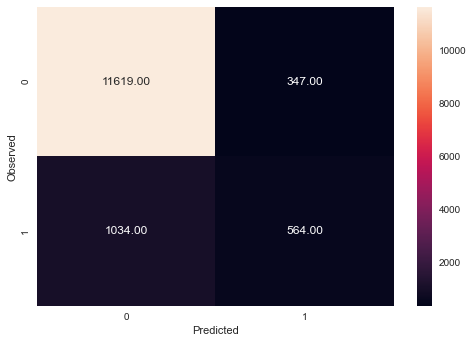

None

Recall: 0.35294117647058826

Precision: 0.6190998902305159

F1 Score: 0.44958150657632523

Roc Auc Score: 0.6619711732261014


,classifier,train score,test score,recall score,precision score,F1 score,roc auc score
0,LogisticRegression,0.90090687900906873952777687009074725210666656...,0.89818637570038339923428338806843385100364685...,0.35294117647058825815165050698851700872182846...,0.61909989023051592571533774389536119997501373...,0.44958150657632522939621821933542378246784210...,0.66197117322610143919092706710216589272022247...


In [82]:
print_model_score(lg_clf, 'LogisticRegression')
df_compare_model

# df_compare_model.round(16)

# df_compare_model["train score"] = df_compare_model["train score"].apply(lambda x: (np.float128)(x*10000000000000000)/10000000000000000)

# df_compare_model.round(decimals=16)

# roundTwoDecimals = np.round(df_compare_model, decimals=6)

# roundTwoDecimals

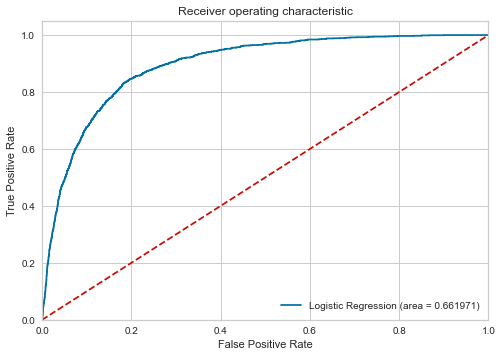

In [83]:
print_model_roc(lg_clf)

In [84]:
print(classification_report(y_test, lg_clf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.92      0.97      0.94     11966
           1       0.62      0.35      0.45      1598

    accuracy                           0.90     13564
   macro avg       0.77      0.66      0.70     13564
weighted avg       0.88      0.90      0.89     13564



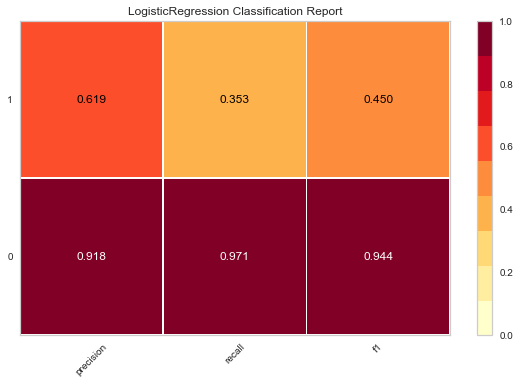

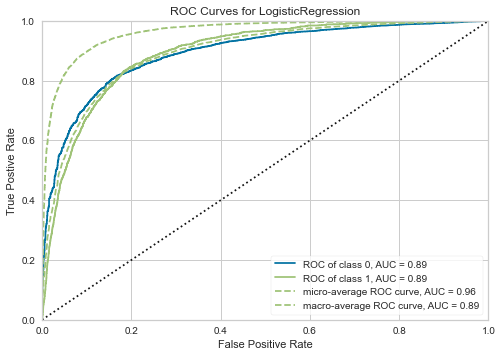

In [85]:
visClassifierResults(lg_clf)

## Build Decision Tree Model <a class="anchor" id='3.3'></a>


We will build our model using the DecisionTreeClassifier function. Using default 'gini' criteria to split. Other option include 'entropy'.  

In [86]:
dTree = DecisionTreeClassifier(criterion = 'gini', random_state=42)
dTree.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

#### Scoring our Decision Tree

In [87]:
print(dTree.score(X_train, y_train))
print(dTree.score(X_test, y_test))

1.0
0.8715718077263345


## Visualizing the Decision Tree


In [88]:
train_char_label = ['No', 'Yes']
Credit_Tree_File = open('credit_tree.dot','w')
dot_data = tree.export_graphviz(dTree, out_file=Credit_Tree_File, feature_names = list(X_train), class_names = list(train_char_label))
Credit_Tree_File.close()

In [89]:
#Works only if "dot" command works on you machine

retCode = system("dot -Tpng credit_tree.dot -o credit_tree.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("credit_tree.png"))

    

Training accuracy 1.0

Testing accuracy 0.8715718077263345

Confusion Matrix
[[11088   878]
 [  864   734]]

True Positives (TP): we correctly predicted that they will take personal loans  734

True Negatives (TN): we correctly predicted that they will not take personal loan  11088

False Positives (FP): we incorrectly predicted that they will take personal loan (a "Type I error")  878  Falsely predict positive Type I error

False Negatives (FN): we incorrectly predicted that they will not take personal loans (a "Type II error") 864  Falsely predict negative Type II error


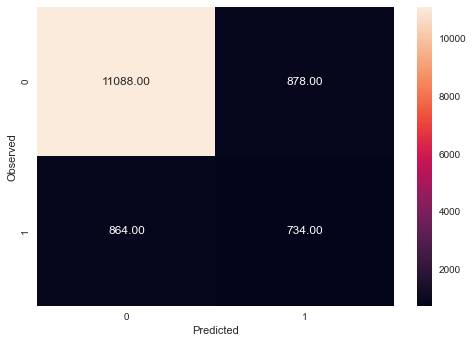

None

Recall: 0.4593241551939925

Precision: 0.45533498759305213

F1 Score: 0.4573208722741433

Roc Auc Score: 0.6929747969685489


,classifier,train score,test score,recall score,precision score,F1 score,roc auc score
0,LogisticRegression,0.90090687900906873952777687009074725210666656...,0.89818637570038339923428338806843385100364685...,0.35294117647058825815165050698851700872182846...,0.61909989023051592571533774389536119997501373...,0.44958150657632522939621821933542378246784210...,0.66197117322610143919092706710216589272022247...
1,Decision Tree,1,0.87157180772633446874664286951883696019649505...,0.45932415519399250047882787839625962078571319...,0.45533498759305213177128734969301149249076843...,0.45732087227414330854458057729061692953109741...,0.69297479696854891173529722436796873807907104...


In [90]:
print_model_score(dTree, "Decision Tree")
df_compare_model

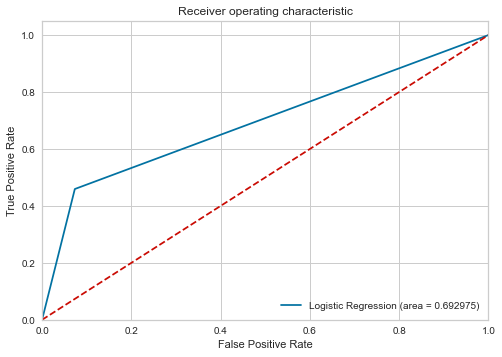

In [91]:
print_model_roc(dTree)

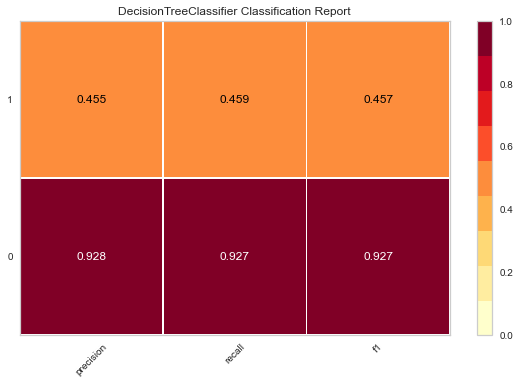

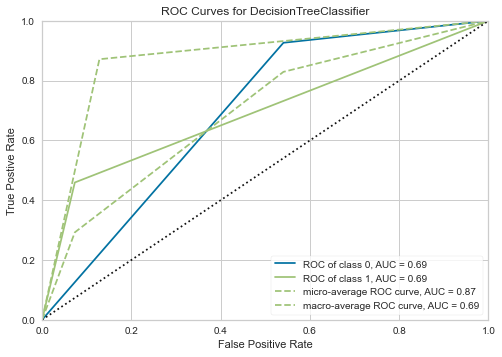

In [92]:
visClassifierResults(dTree)

In [93]:
# Let's look at the feature importance
imp_features = pd.DataFrame(dTree.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by='Imp', ascending=False)
imp_features[imp_features.Imp >= 0.01].sort_values(by='Imp', ascending=False)

,Imp
duration,0.27
age,0.10
balance,0.09
poutcome_success,0.09
pdays,0.04
campaign,0.03
previous,0.02
housing_yes,0.01
month_mar,0.01
month_oct,0.01


## Decision Tree reducing over fitting (Regularization) <a class="anchor" id='3.4'></a>

In [94]:
dTreeR = DecisionTreeClassifier(criterion = 'gini', max_depth = 6, random_state=42)
dTreeR.fit(X_train, y_train)
print(dTreeR.score(X_train, y_train))
print(dTreeR.score(X_test, y_test))

0.9085537333712517
0.9005455617811855


In [95]:
# train_char_label = ['No', 'Yes']
# Credit_Tree_FileR = open('credit_treeR.dot','w')
# dot_data = tree.export_graphviz(dTreeR, out_file=Credit_Tree_FileR, feature_names = list(X_train), class_names = list(train_char_label))
# Credit_Tree_FileR.close()

# #Works only if "dot" command works on you machine

# retCode = system("dot -Tpng credit_treeR.dot -o credit_treeR.png")
# if(retCode>0):
#     print("system command returning error: "+str(retCode))
# else:
#     display(Image("credit_treeR.png"))



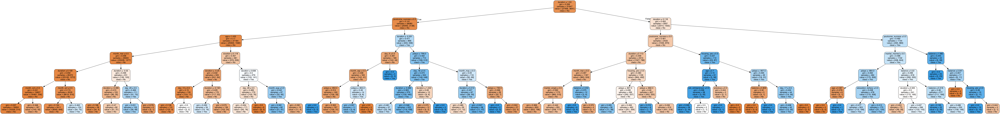

In [96]:
# Draw Decision tree
draw_tree(dTreeR, X_train, y_train, 'dtree_model.dot', 'dtree_model.png', ['No', 'Yes'], list(X_train))

In [97]:
# importance of features in the tree building ( The importance of a feature is computed as the 
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

# Let's look at the feature importance
imp_features = pd.DataFrame(dTreeR.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by='Imp', ascending=False)
imp_features[imp_features.Imp > 0.001].sort_values(by='Imp', ascending=False)

,Imp
duration,0.54
poutcome_success,0.28
age,0.05
month_mar,0.04
month_oct,0.03
pdays,0.01
balance,0.01
housing_yes,0.01
month_may,0.00
month_aug,0.00


Training accuracy 0.9085537333712517

Testing accuracy 0.9005455617811855

Confusion Matrix
[[11610   356]
 [  993   605]]

True Positives (TP): we correctly predicted that they will take personal loans  605

True Negatives (TN): we correctly predicted that they will not take personal loan  11610

False Positives (FP): we incorrectly predicted that they will take personal loan (a "Type I error")  356  Falsely predict positive Type I error

False Negatives (FN): we incorrectly predicted that they will not take personal loans (a "Type II error") 993  Falsely predict negative Type II error


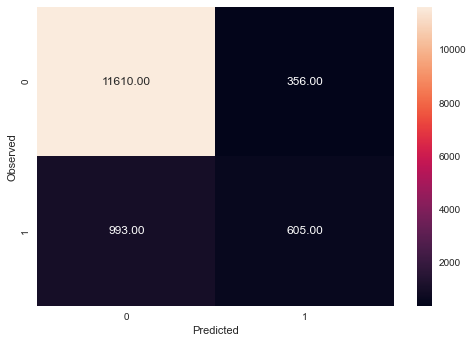

None

Recall: 0.3785982478097622

Precision: 0.6295525494276795

F1 Score: 0.4728409534974599

Roc Auc Score: 0.674423643376718


In [98]:
print_model_score(dTreeR, "Decision Tree Regressor")

In [99]:

df_compare_model

,classifier,train score,test score,recall score,precision score,F1 score,roc auc score
0,LogisticRegression,0.90090687900906873952777687009074725210666656...,0.89818637570038339923428338806843385100364685...,0.35294117647058825815165050698851700872182846...,0.61909989023051592571533774389536119997501373...,0.44958150657632522939621821933542378246784210...,0.66197117322610143919092706710216589272022247...
1,Decision Tree,1,0.87157180772633446874664286951883696019649505...,0.45932415519399250047882787839625962078571319...,0.45533498759305213177128734969301149249076843...,0.45732087227414330854458057729061692953109741...,0.69297479696854891173529722436796873807907104...
2,Decision Tree Regressor,0.90855373337125167054750818351749330759048461...,0.90054556178118549958355743001447990536689758...,0.37859824780976220059969250542053487151861190...,0.62955254942767946424453384679509326815605163...,0.47284095349745991487822038834565319120883941...,0.67442364337671800722517900794628076255321502...


The confusion matrix

True Positives (TP): we correctly predicted that they will take personal loans 471

True Negatives (TN): we correctly predicted that they will not take personal loan 11709

False Positives (FP): we incorrectly predicted that they will take personal loan (a "Type I error") 257 Falsely predict positive Type I error

False Negatives (FN): we incorrectly predicted that they will not take personal loans (a "Type II error") 1127 Falsely predict negative Type II error

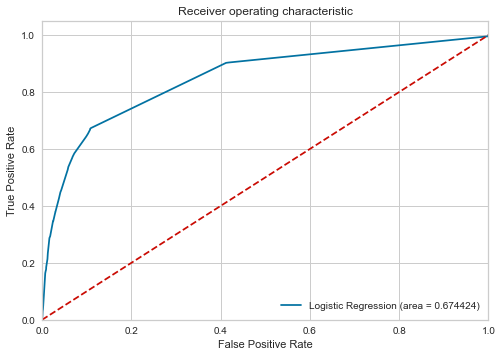

In [100]:
print_model_roc(dTreeR)

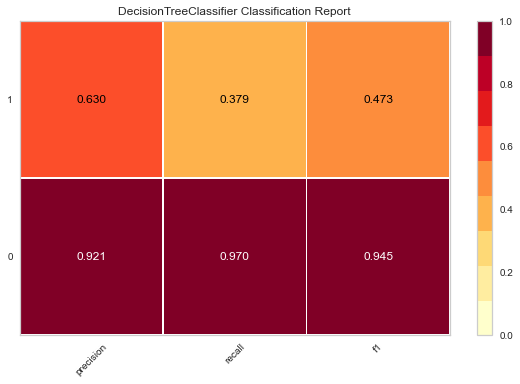

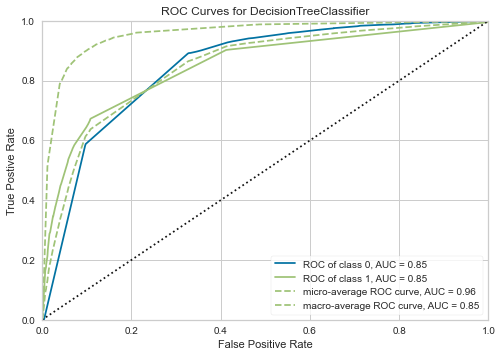

In [101]:
visClassifierResults(dTreeR)

<a id  = ensemblelearning></a>
#                             Ensemble Learning - Bagging <a class="anchor" id='3.5'></a>

In [102]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(base_estimator=dTree, n_estimators=50,random_state=42)
#bgcl = BaggingClassifier(n_estimators=50,random_state=1)

bgcl = bgcl.fit(X_train, y_train)

# y_predict = bgcl.predict(X_test)

Training accuracy 0.9996524157108099

Testing accuracy 0.9015777056915364

Confusion Matrix
[[11540   426]
 [  909   689]]

True Positives (TP): we correctly predicted that they will take personal loans  689

True Negatives (TN): we correctly predicted that they will not take personal loan  11540

False Positives (FP): we incorrectly predicted that they will take personal loan (a "Type I error")  426  Falsely predict positive Type I error

False Negatives (FN): we incorrectly predicted that they will not take personal loans (a "Type II error") 909  Falsely predict negative Type II error


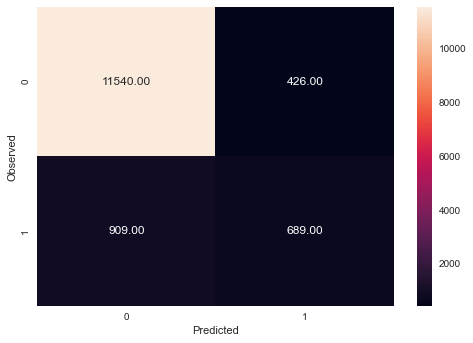

None

Recall: 0.4311639549436796

Precision: 0.6179372197309417

F1 Score: 0.5079248064872834

Roc Auc Score: 0.6977815429072401


In [103]:
print_model_score(bgcl, "Bagging")


In [104]:
df_compare_model

,classifier,train score,test score,recall score,precision score,F1 score,roc auc score
0,LogisticRegression,0.90090687900906873952777687009074725210666656...,0.89818637570038339923428338806843385100364685...,0.35294117647058825815165050698851700872182846...,0.61909989023051592571533774389536119997501373...,0.44958150657632522939621821933542378246784210...,0.66197117322610143919092706710216589272022247...
1,Decision Tree,1,0.87157180772633446874664286951883696019649505...,0.45932415519399250047882787839625962078571319...,0.45533498759305213177128734969301149249076843...,0.45732087227414330854458057729061692953109741...,0.69297479696854891173529722436796873807907104...
2,Decision Tree Regressor,0.90855373337125167054750818351749330759048461...,0.90054556178118549958355743001447990536689758...,0.37859824780976220059969250542053487151861190...,0.62955254942767946424453384679509326815605163...,0.47284095349745991487822038834565319120883941...,0.67442364337671800722517900794628076255321502...
3,Bagging,0.99965241571080987181829868859495036303997039...,0.90157770569153639073078920773696154356002807...,0.43116395494367959484449670526373665779829025...,0.61793721973094173360863123889430426061153411...,0.50792480648728344228004516480723395943641662...,0.69778154290724014874314207190764136612415313...


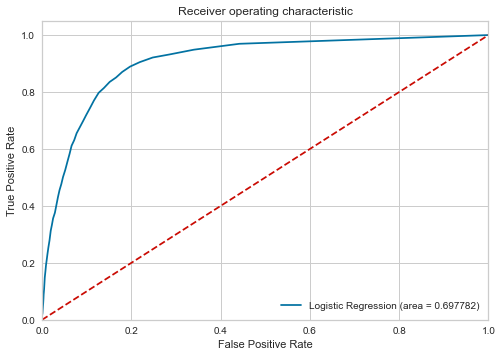

In [105]:
print_model_roc(bgcl)

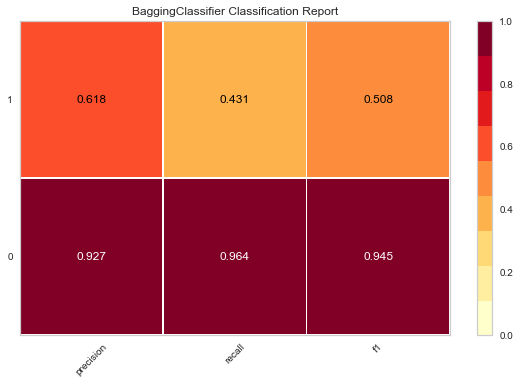

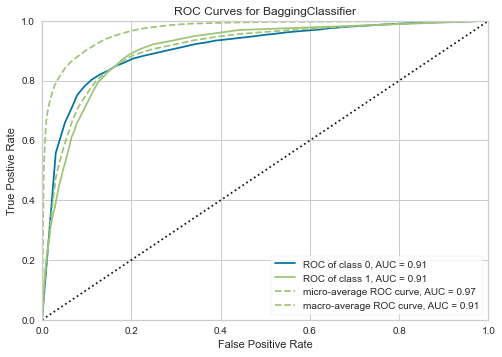

In [106]:
visClassifierResults(bgcl)

# Ensemble Learning - AdaBoosting  <a class="anchor" id='3.6'></a>

In [107]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators=10, random_state=42)
#abcl = AdaBoostClassifier( n_estimators=50,random_state=1)
abcl = abcl.fit(X_train, y_train)


Training accuracy 0.8941763832274782

Testing accuracy 0.8908876437629017

Confusion Matrix
[[11462   504]
 [  976   622]]

True Positives (TP): we correctly predicted that they will take personal loans  622

True Negatives (TN): we correctly predicted that they will not take personal loan  11462

False Positives (FP): we incorrectly predicted that they will take personal loan (a "Type I error")  504  Falsely predict positive Type I error

False Negatives (FN): we incorrectly predicted that they will not take personal loans (a "Type II error") 976  Falsely predict negative Type II error


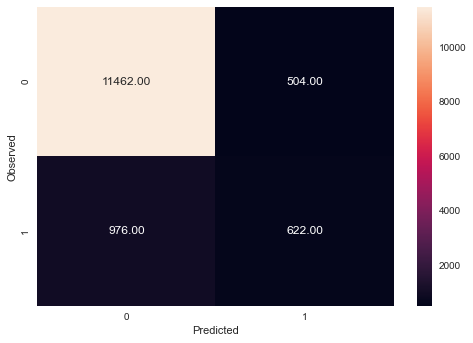

None

Recall: 0.38923654568210264

Precision: 0.5523978685612788

F1 Score: 0.4566813509544787

Roc Auc Score: 0.673558603778708


,classifier,train score,test score,recall score,precision score,F1 score,roc auc score
0,LogisticRegression,0.90090687900906873952777687009074725210666656...,0.89818637570038339923428338806843385100364685...,0.35294117647058825815165050698851700872182846...,0.61909989023051592571533774389536119997501373...,0.44958150657632522939621821933542378246784210...,0.66197117322610143919092706710216589272022247...
1,Decision Tree,1,0.87157180772633446874664286951883696019649505...,0.45932415519399250047882787839625962078571319...,0.45533498759305213177128734969301149249076843...,0.45732087227414330854458057729061692953109741...,0.69297479696854891173529722436796873807907104...
2,Decision Tree Regressor,0.90855373337125167054750818351749330759048461...,0.90054556178118549958355743001447990536689758...,0.37859824780976220059969250542053487151861190...,0.62955254942767946424453384679509326815605163...,0.47284095349745991487822038834565319120883941...,0.67442364337671800722517900794628076255321502...
3,Bagging,0.99965241571080987181829868859495036303997039...,0.90157770569153639073078920773696154356002807...,0.43116395494367959484449670526373665779829025...,0.61793721973094173360863123889430426061153411...,0.50792480648728344228004516480723395943641662...,0.69778154290724014874314207190764136612415313...
4,Adaptive Boosting,0.89417638322747816648217167312395758926868438...,0.89088764376290174862305093483882956206798553...,0.38923654568210264148575561193865723907947540...,0.55239786856127881531364209877210669219493865...,0.45668135095447870419604896596865728497505187...,0.67355860377870802047084453079150989651679992...


In [108]:
print_model_score(abcl, 'Adaptive Boosting')
df_compare_model

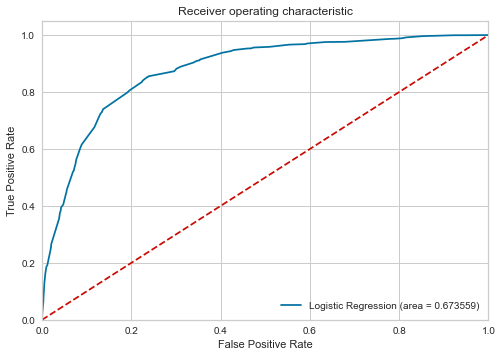

In [109]:
print_model_roc(abcl)

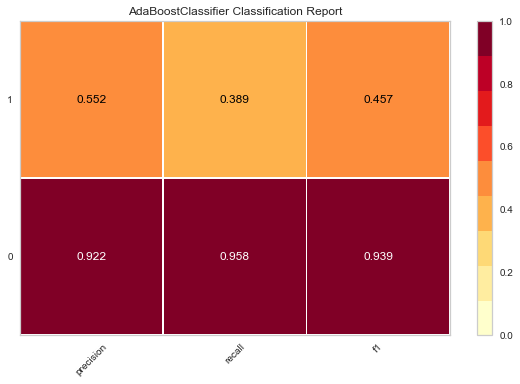

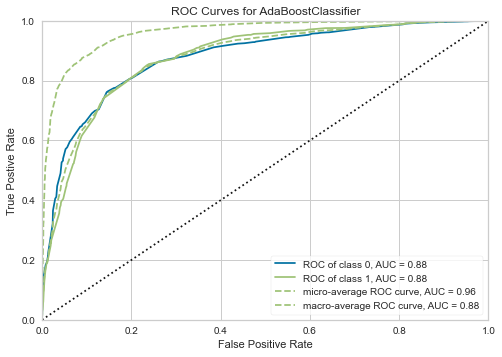

In [110]:
visClassifierResults(abcl)

#                     Ensemble Learning - GradientBoost <a class="anchor" id='3.7'></a>


In [111]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50,random_state=42)
gbcl = gbcl.fit(X_train, y_train)


Training accuracy 0.9068474104970455

Testing accuracy 0.8995134178708346

Confusion Matrix
[[11634   332]
 [ 1031   567]]

True Positives (TP): we correctly predicted that they will take personal loans  567

True Negatives (TN): we correctly predicted that they will not take personal loan  11634

False Positives (FP): we incorrectly predicted that they will take personal loan (a "Type I error")  332  Falsely predict positive Type I error

False Negatives (FN): we incorrectly predicted that they will not take personal loans (a "Type II error") 1031  Falsely predict negative Type II error


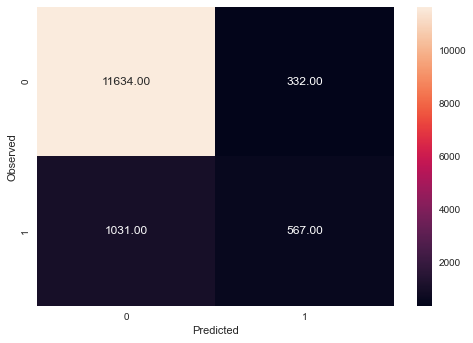

None

Recall: 0.3548185231539424

Precision: 0.6307007786429366

F1 Score: 0.45414497396876247

Roc Auc Score: 0.6635366224327293


In [112]:
print_model_score(gbcl, 'Gradient Boost')

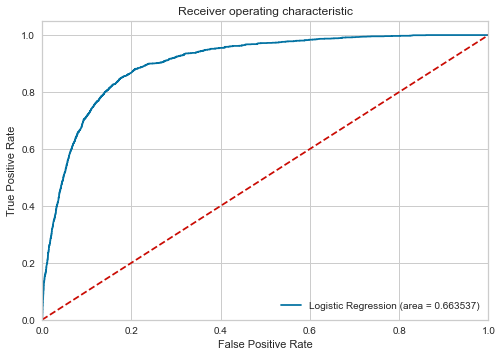

In [113]:
print_model_roc(gbcl)

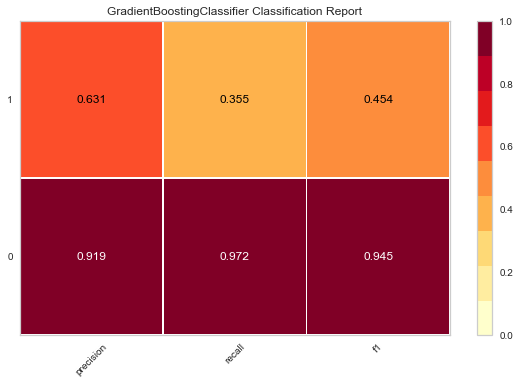

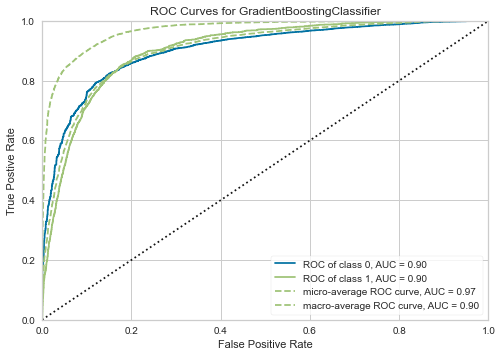

In [114]:
visClassifierResults(gbcl)

# Ensemble RandomForest Classifier <a class="anchor" id='3.8'></a>


In [115]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 100, random_state=42)
# rfcl = RandomForestClassifier(n_estimators = 50, random_state=1, max_features=12)
rfcl = rfcl.fit(X_train, y_train)


Training accuracy 0.9999368028565109

Testing accuracy 0.9067384252432911

Confusion Matrix
[[11678   288]
 [  977   621]]

True Positives (TP): we correctly predicted that they will take personal loans  621

True Negatives (TN): we correctly predicted that they will not take personal loan  11678

False Positives (FP): we incorrectly predicted that they will take personal loan (a "Type I error")  288  Falsely predict positive Type I error

False Negatives (FN): we incorrectly predicted that they will not take personal loans (a "Type II error") 977  Falsely predict negative Type II error


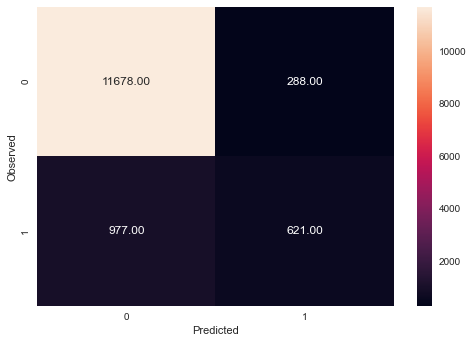

None

Recall: 0.3886107634543179

Precision: 0.6831683168316832

F1 Score: 0.49541284403669716

Roc Auc Score: 0.6822712851201056


In [116]:
print_model_score(rfcl, "Random Forest")

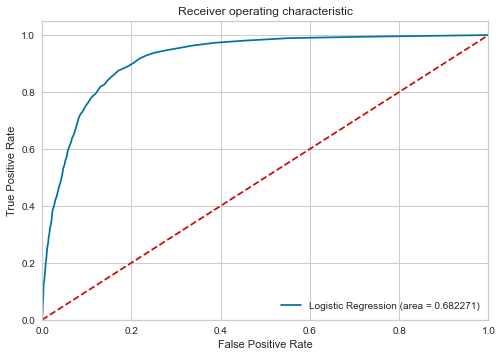

In [117]:
print_model_roc(rfcl)

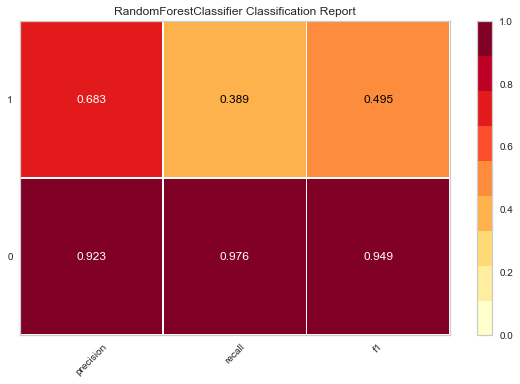

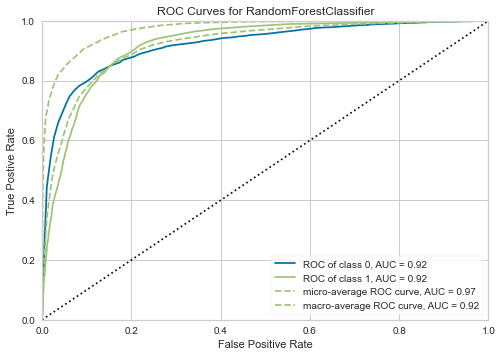

In [118]:
visClassifierResults(rfcl)

# Make a DataFrame to compare models and their metrics. Give conclusion regarding the best algorithm and your reason behind it  <a class="anchor" id='3.9'></a>

#### We have been creating the compare dataframes when running different models. 

In [119]:
df_compare_model

,classifier,train score,test score,recall score,precision score,F1 score,roc auc score
0,LogisticRegression,0.90090687900906873952777687009074725210666656...,0.89818637570038339923428338806843385100364685...,0.35294117647058825815165050698851700872182846...,0.61909989023051592571533774389536119997501373...,0.44958150657632522939621821933542378246784210...,0.66197117322610143919092706710216589272022247...
1,Decision Tree,1,0.87157180772633446874664286951883696019649505...,0.45932415519399250047882787839625962078571319...,0.45533498759305213177128734969301149249076843...,0.45732087227414330854458057729061692953109741...,0.69297479696854891173529722436796873807907104...
2,Decision Tree Regressor,0.90855373337125167054750818351749330759048461...,0.90054556178118549958355743001447990536689758...,0.37859824780976220059969250542053487151861190...,0.62955254942767946424453384679509326815605163...,0.47284095349745991487822038834565319120883941...,0.67442364337671800722517900794628076255321502...
3,Bagging,0.99965241571080987181829868859495036303997039...,0.90157770569153639073078920773696154356002807...,0.43116395494367959484449670526373665779829025...,0.61793721973094173360863123889430426061153411...,0.50792480648728344228004516480723395943641662...,0.69778154290724014874314207190764136612415313...
4,Adaptive Boosting,0.89417638322747816648217167312395758926868438...,0.89088764376290174862305093483882956206798553...,0.38923654568210264148575561193865723907947540...,0.55239786856127881531364209877210669219493865...,0.45668135095447870419604896596865728497505187...,0.67355860377870802047084453079150989651679992...
5,Gradient Boost,0.90684741049704553628174608093104325234889984...,0.89951341787083460843632565229199826717376708...,0.35481852315394241115242834894161205738782882...,0.63070077864293661029648774274392053484916687...,0.45414497396876246648744768208416644483804702...,0.66353662243272926168913272704230621457099914...
6,Random Forest,0.99993680285651087569220862860674969851970672...,0.90673842524329106851155302138067781925201416...,0.38861076345431788681139551044907420873641967...,0.68316831683168321998067540334886871278285980...,0.49541284403669716418505686306161805987358093...,0.68227128512010559724387803726131096482276916...


#### Random Forest and Bagging performed very close and much better in train and test score
#### Bagging did better in recall score 0.431 and Ramdom Forest is the next 0.388
#### Ramdom Forest did better in precision score than all others
#### Bagging did better in F1 score and ROC and the next best was Ramdom Forest

Predicted that customer who are interested in opening term deposit account will be approached

Here the bank wants to reach people who will open term deposit but our model predicted they will not take loan i.e. less number of False Negative, if FN is high, bank would lose on prospect customers. So that the bank doesn't lose money who are willing to open term deposit. Hence Recall is the important metric.

In case of False positive, bank will lose effort to reach out to a few people but thats okay because the bank thought that these people will open term deposit but they did not take. This number is quite low i.e. 288 for Random Forest and 426 for Bagging and the precision percent is quite good 68% for Random Forest as compared to 61% for Bagging.

## Conclusion:
#### Both Random Forest and Bagging compete well and we can pick either of them but since the Ramdom Forest did better in test accuracy it can be concluded as the winner.
